<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/starvation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/starvation_Analysis.ipynb)

In [ ]:
!date

Tue Aug 25 18:50:05 UTC 2020


In [ ]:
 #Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing
!wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww

In [ ]:
#CellRanger Starvation h5ad data
!wget --quiet https://caltech.box.com/shared/static/ts2i8pid7uky28kke4duyl8jwugx8z4h

In [ ]:

#Kallisto bus clustered starvation data, h5ad

!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w




In [ ]:
#Human ortholog annotations
!wget --quiet https://caltech.box.com/shared/static/slxs7968tths1xotumohnzwy6pgdtk6k

#Panther annotations
!wget --quiet https://caltech.box.com/shared/static/vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt

#GO Terms
!wget --quiet https://caltech.box.com/shared/static/0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof

#Saved DeSeq2 Results for Fed/Starved
!wget --quiet https://caltech.box.com/shared/static/vy27o8yx0tb1ub3ifug770y32kr8o833

#Markers to plot (cell atlas)
!wget --quiet https://caltech.box.com/shared/static/fir0k32obqmj75n2jss6q5ti18zs7dxl

#Transporter XLOCs
!wget --quiet https://caltech.box.com/shared/static/vfjwgcn1l26m48x46b0tqedb8f2yiarp

#GPCR XLOCs
!wget --quiet https://caltech.box.com/shared/static/s43ehjf5wxmku2nb0ht4nraph9iye9ez

In [ ]:
# #Change TRINITY names
#!wget --quiet https://caltech.box.com/shared/static/kl4o9v9623v4izgkt3rarapi7y6b1xpb

In [ ]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg
!pip install --quiet louvain

     |████████████████████████████████| 122kB 2.8MB/s 
     |████████████████████████████████| 7.7MB 2.6MB/s 
     |████████████████████████████████| 51kB 6.2MB/s 
     |████████████████████████████████| 61kB 6.8MB/s 
     |████████████████████████████████| 2.4MB 2.8MB/s 
     |████████████████████████████████| 3.2MB 23.9MB/s 
     |████████████████████████████████| 2.2MB 2.8MB/s 


In [ ]:
!pip3 install --quiet rpy2

###**Import Packages** 

In [ ]:
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import scale

import random

# import scrublet as scr

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")
%load_ext rpy2.ipython

In [ ]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('slxs7968tths1xotumohnzwy6pgdtk6k'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True) 
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True) 
hg_ortho_df['Description']= hg_ortho_df[11]
#hg_ortho_df.head()

panther_df = pd.read_csv('vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt',
            sep="\t",header=None) #skiprows=[0,1,2,3]

#panther_df.head()

goTerm_df = pd.read_csv('0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof',
            sep=" ",header=None) #skiprows=[0,1,2,3]


####**Gene Filtering & Clustering**

In [ ]:
#Read in starvation data

#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
print(bus_fs_raw )



#CellRanger h5ad file with old louvain clustering
cellRanger_fs = anndata.read("ts2i8pid7uky28kke4duyl8jwugx8z4h")
print(cellRanger_fs)

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 2657
    obs: 'n_counts', 'n_countslog', 'louvain', 'orgID', 'fed', 'starved', 'fed_ord', 'starved_ord', 'new_fed', 'fed_neighbor_score'
    var: 'n_counts', 'n_cells'
    uns: 'fed_ord_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'new_fed_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'starved_ord_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain'

In [ ]:
#Find highly variable genes from all nonzero genes

#How annotated/filtered adata was made

# sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
# sc.pp.filter_genes(bus_fs_raw, min_counts=0)
# bus_fs_raw.obs['n_countslog']=np.log10(bus_fs_raw.obs['n_counts'])

# bus_fs_raw.raw = sc.pp.log1p(bus_fs_raw, copy=True)
# sc.pp.normalize_per_cell(bus_fs_raw, counts_per_cell_after=1e4)
# filter_result = sc.pp.filter_genes_dispersion(
#     bus_fs_raw.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)
# sc.pl.filter_genes_dispersion(filter_result)

In [ ]:
#Filter genes from anndata
# bus_fs_raw = bus_fs_raw[:, filter_result.gene_subset]

# print(bus_fs_raw)

In [ ]:
#Apply cellranger labels

In [ ]:
#How to get PAGA/UMAP embedding
#PUT IN PCA CALC HERE
# sc.pp.neighbors(bus_fs_raw,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_raw, groups='cellRanger_louvain',)
# sc.pl.paga(bus_fs_raw, color=['cellRanger_louvain']))

# sc.tl.umap(bus_fs_raw,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3


In [ ]:
#Code here for neighbor score
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get fed observation for this cell
    cellObs = adata.obs['fed'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['fed'][l]
      
    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

In [ ]:
# bus_fs_clus.obs['fed_neighbor_score'] = neighborScores(bus_fs_clus,True)

##**Read in PREVIOUSLY SAVED clustered and labeled data**
Use for downstream analysis

In [ ]:
#Read in PREVIOUSLY SAVED clustered + labeled data
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs_clus )

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


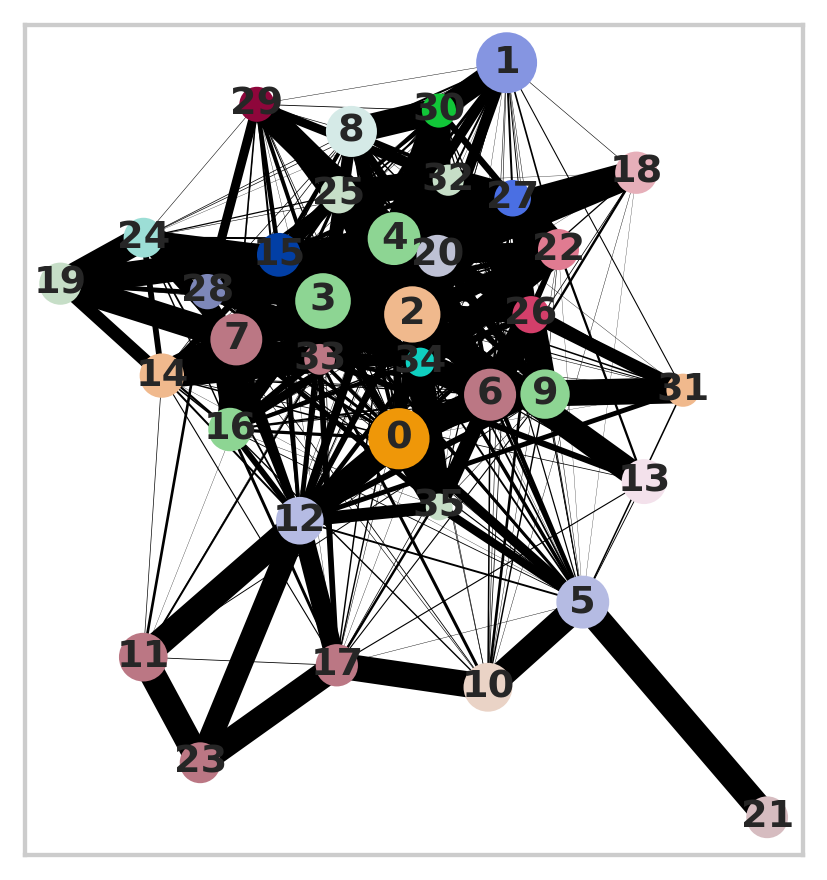

In [ ]:
# sc.pp.neighbors(bus_fs_clus,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_clus, groups='cellRanger_louvain',)
sc.pl.paga(bus_fs_clus, color=['cellRanger_louvain'])

In [ ]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

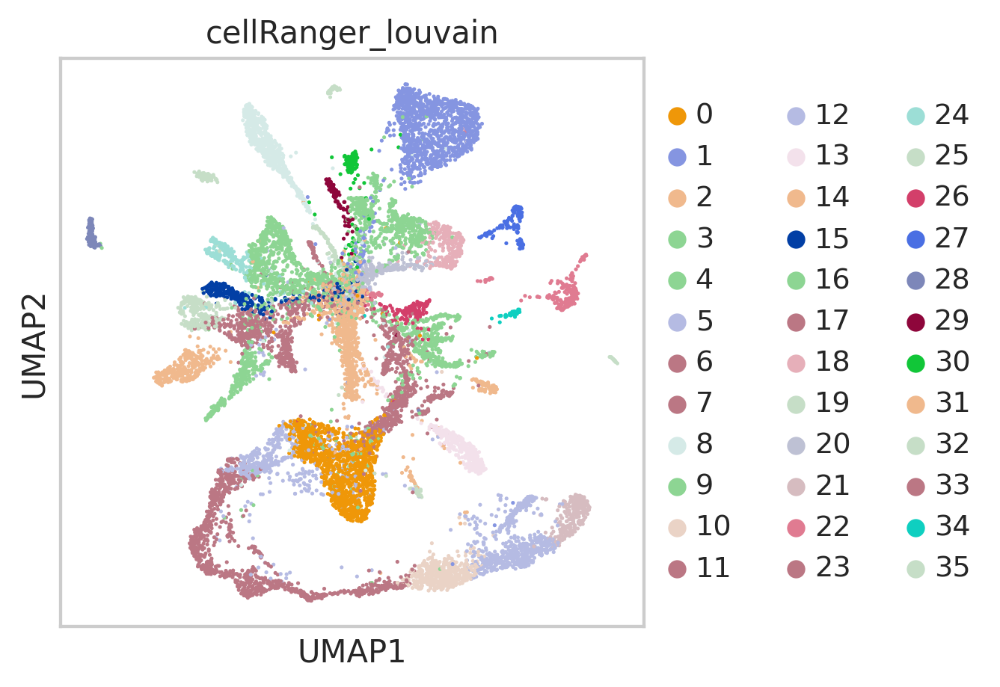

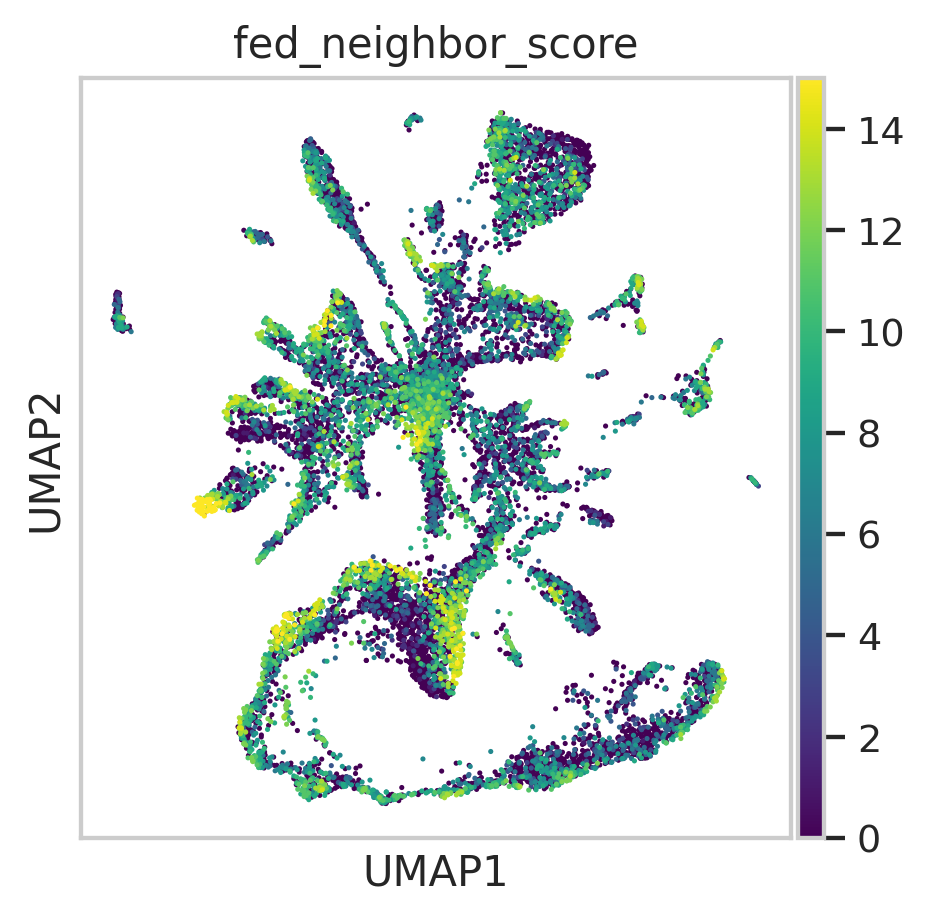

In [ ]:
#sc.tl.umap(bus_fs_clus,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3

#bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['cellRanger_louvain'])
sc.pl.umap(bus_fs_clus,color=['fed_neighbor_score'],color_map='viridis')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


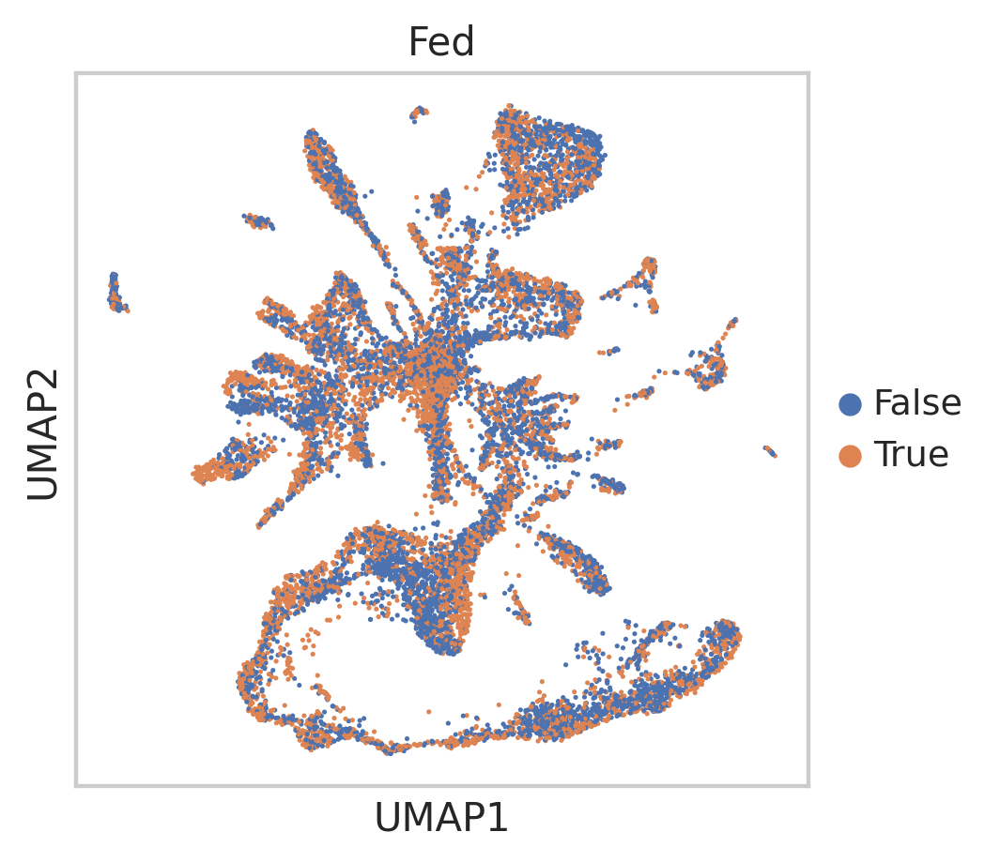

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

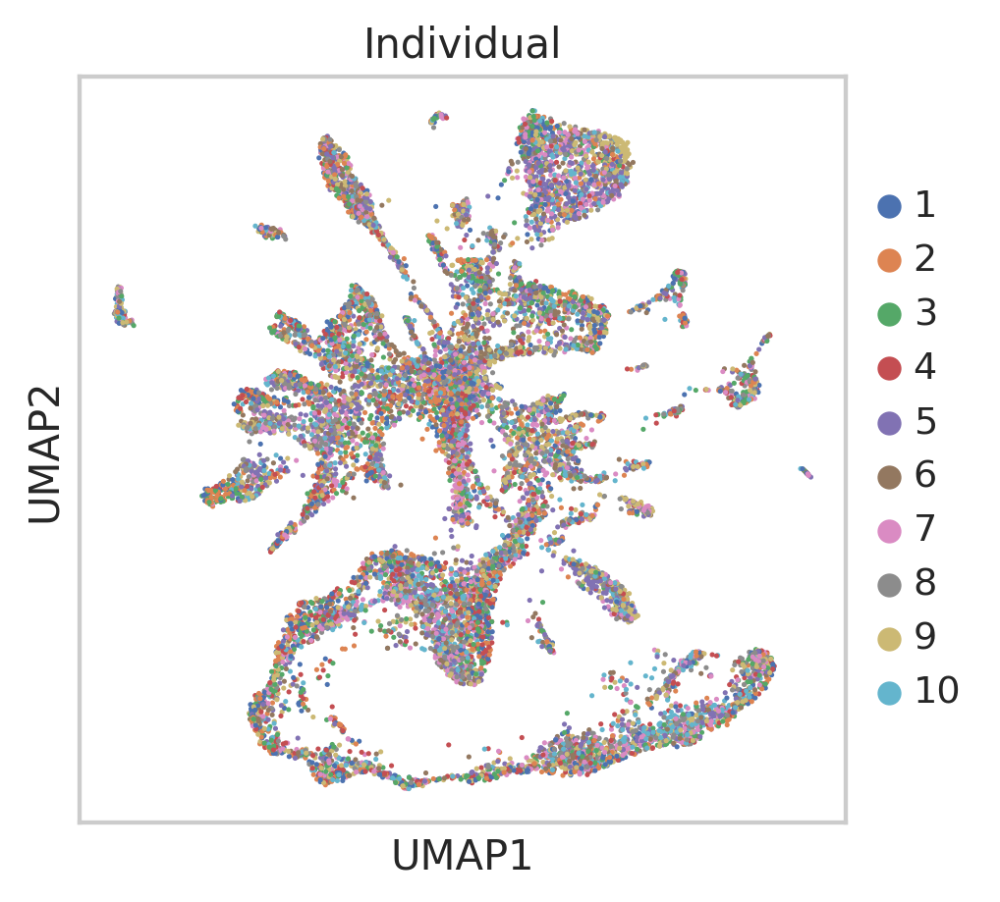

In [ ]:

bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['Fed'],color_map='viridis')
bus_fs_clus.obs['Individual'] = pd.Categorical(bus_fs_clus.obs['orgID'])
sc.pl.umap(bus_fs_clus,color=['Individual'],color_map='viridis')

###**How Cluster Labels are Assigned**

In [ ]:
def annotateLouvain(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12,17,11,23]:
      cluster_types += ['Nematocyte']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2,13]:
      cluster_types += ['Germ Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7,15,3,14,19,24]:
      cluster_types += ['Digestive Endoderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5,10,21]:
      cluster_types += ['Sensory Hair Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['Stem Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6,9,26,31]:
      cluster_types += ['Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['AP2 Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cell Subtype']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Anistasin Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Lipase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Acidic Chitinase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Early Oocytes']
    
  bus_fs_clus.obs['annos'] = pd.Categorical(cluster_types)

annotateLouvain(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos'
    var: 'n_counts', 'mean', 'std'
    uns: 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#Get colors for broad class annotations, and apply colors to 36 subclusters
colors = bus_fs_clus.uns['annos_colors']
colorsCellR = bus_fs_clus.uns['cellRanger_louvain_colors']

annos_names = bus_fs_clus.obs["annos"].cat.categories
cellR_names = bus_fs_clus.obs["cellRanger_louvain"].cat.categories

annos_dict = {}
annos_dict['Nematocyte'] = [12,17,11,23]
annos_dict['Germ Cells'] = [2,13]
annos_dict['Digestive Endoderm'] = [7,15,3,14,19,24]
annos_dict['Sensory Hair Cells'] = [5,10,21]
annos_dict['Stem Cells'] = [0]
annos_dict['Exumbrella Epidermis'] = [1]
annos_dict['Manubrium Epidermis'] = [4]
annos_dict['Neurons'] = [6,9,26,31]
annos_dict['Striated Muscle - Subumbrella'] = [8]
annos_dict['Tentacle Bulb Epidermis'] = [16]
annos_dict['Radial Smooth Muscles'] = [18]
annos_dict['Tentacle Epidermis'] = [20]
annos_dict['AP2 Gland Cells'] = [22]
annos_dict['Gland Cell Subtype'] = [25]
annos_dict['Anistasin Gland Cells'] = [27]
annos_dict['Bioluminescent Cells'] = [28]
annos_dict['Gonad Epidermis'] = [29]
annos_dict['Striated Muscle - Velum'] = [30]
annos_dict['Lipase Gland Cells'] = [32]
annos_dict['Endodermal Plate'] = [33]
annos_dict['Acidic Chitinase Gland Cells'] = [34]
annos_dict['Early Oocytes'] = [35]

#annos_dict

In [ ]:
#Update subclusters colors with broad cluster colors
for n in annos_names:
  pos = annos_dict[n]
  for p in pos:
    #new_pos =  np.where(cellR_names == p)
    pos_2 = np.where(annos_names == n)
    colorsCellR[p] = colors[pos_2][0]

#colorsCellR
colorsCopy = colorsCellR.copy()

In [ ]:
#Append color information to adata
bus_fs_clus.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_clus.uns['new_cellRanger_louvain_colors'] = colorsCellR

#Convert labels to string format for plotting - and update order of colors
#Make dictionary with cellRanger_louvain 36 clusters and new names --> new_cellRanger_louvain
bus_fs_clus.obs['new_cellRanger_louvain'] = [str(i) for i in bus_fs_clus.obs['new_cellRanger_louvain']]
bus_fs_clus.obs['new_cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['new_cellRanger_louvain'])

new_cats = bus_fs_clus.obs['new_cellRanger_louvain'].cat.categories

new_colors = bus_fs_clus.uns['new_cellRanger_louvain_colors']
for i in range(0,len(new_cats)):
  new_colors[i] = colorsCopy[int(new_cats[i])]

bus_fs_clus.uns['new_cellRanger_louvain_colors'] = new_colors

#Create dendrogram for subclusters
sc.tl.dendrogram(bus_fs_clus,'new_cellRanger_louvain',linkage_method='ward')


bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_['new_cellRanger_louvain']"]



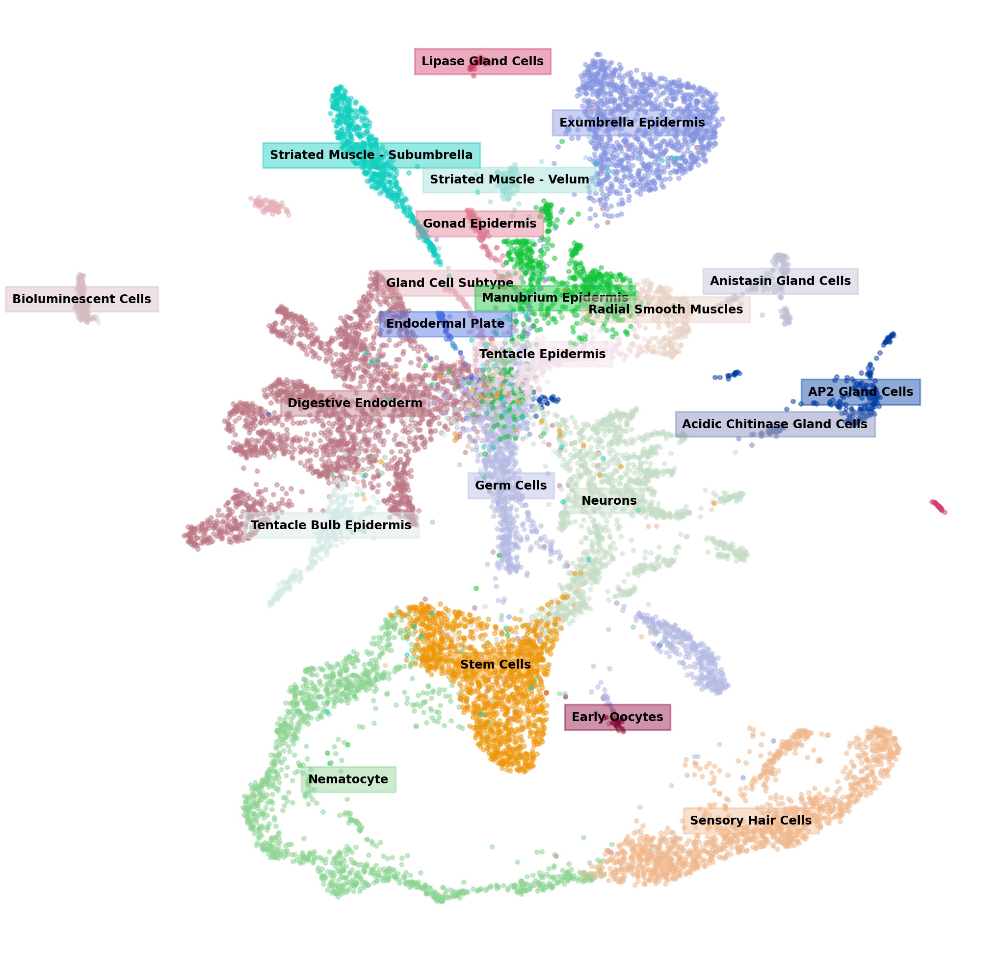

In [ ]:
colors = bus_fs_clus.uns['annos_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["annos"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.annos == cluster,:].obsm["X_umap"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=cluster,s=5)
    if name != 'Manubrium Epidermis':
      ax.annotate(name, 
              (np.median(x), np.median(y)),
              horizontalalignment='center',
              verticalalignment='bottom',
              size=7, weight='bold',
              color="black",
                backgroundcolor=cmap[idx])
    else:
       ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=7, weight='bold',
             color="black",
               backgroundcolor=cmap[idx])
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

In [ ]:
#Names for 36 subclusters
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursor']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Late Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Early Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Large Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['Digestive Subtype 2']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['Digestive Subtype 4']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['Digestive Subtype 1']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['Digestive Subtype 3']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['Digestive Subtype 5']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['Digestive Subtype 6']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Sensory Hair Cell Subtype 1']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Sensory Hair Cell Subtype 2']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Sensory Hair Cells Subtype 3']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['Stem Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neuroblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['GLWamide Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['RFamide Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['YFamide Neurons']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['AP2 Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cell Subtype']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Anistasin Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Lipase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Acidic Chitinase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Early Oocytes']
    
  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'orgID_colors', 'paga', 'pca', 'umap', 'new_cellRanger_louvain_colors', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

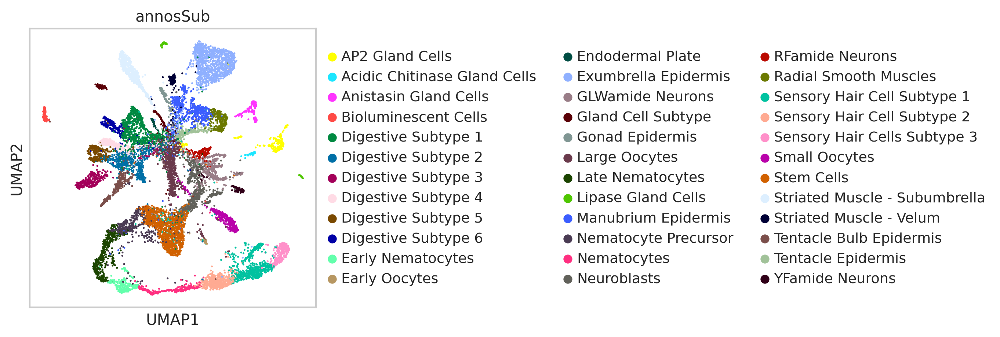

In [ ]:
sc.pl.umap(bus_fs_clus,color='annosSub')

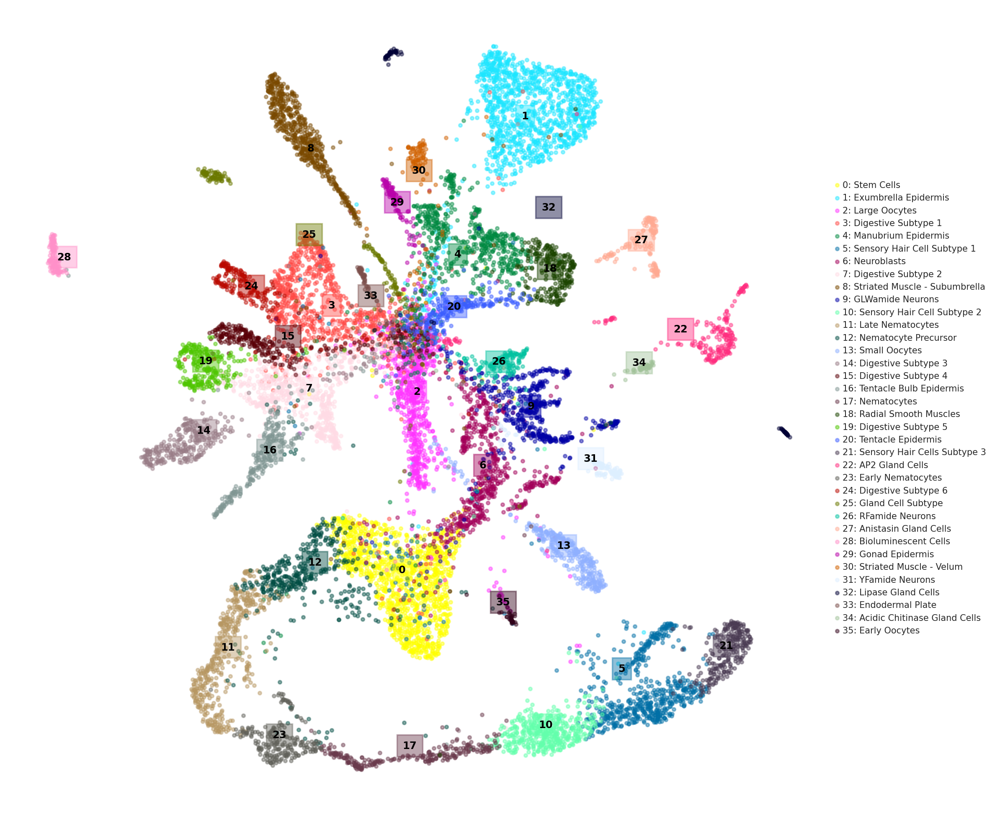

In [ ]:
colors = bus_fs_clus.uns['annosSub_colors']#bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["cellRanger_louvain"].values)#np.unique(bus_fs_clus.obs["annosSub"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=7, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 6},frameon=False)
ax.set_axis_off()
plt.show()

In [ ]:
# bus_fs_clus.write('fedStarved_withUMAPPaga.h5ad')

###**Heatmaps for Top Markers**

In [ ]:
#Get top n marker genes for each cluster

#Keep top 100 genes, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'cellRanger_louvain',n_genes = 100,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
markers = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers['clus'] = clus
markers['markerGene'] = markerGene
markers['padj'] = padj

markers['orthoGene'] = orthoGene
markers['orthoDescr'] = orthoDescr

markers['pantherID'] = pantherNum
markers['pantherDescr'] = pantherDescr

markers['goTerms'] = goTerms
     
markers.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],[PTHR24031:SF521],[SPLICEOSOME RNA HELICASE DDX39B],"[GO:0015931,GO:0051169,GO:0006807,GO:0030529,G..."
1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,[PTHR11353:SF139],[T-COMPLEX PROTEIN 1 SUBUNIT ETA],"[GO:0019538,GO:0044238,GO:0006461,GO:0006457,G..."
2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,[PTHR10804:SF125],"[PROLIFERATION-ASSOCIATED 2G4 ,B]","[GO:0016787,GO:0044238,GO:0008152,GO:0006508,G..."
3,0,XLOC_017967,0.0,NA,NA,NA,NA,[nan]
4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],[PTHR11843:SF5],[40S RIBOSOMAL PROTEIN S12],"[GO:0005737,GO:0005622,GO:0032991,GO:0005840,G..."


In [ ]:
#Write to csv
markers.to_csv('fs_marker_annotations.csv')

#Read in csv (previously saved version, uploaded to Box)
markers = pd.read_csv('fs_marker_annotations.csv',
            sep=",")
markers.head()

,Unnamed: 0,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],"['GO:0015931,GO:0051169,GO:0006807,GO:0030529,..."
1,1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,['PTHR11353:SF139'],['T-COMPLEX PROTEIN 1 SUBUNIT ETA'],"['GO:0019538,GO:0044238,GO:0006461,GO:0006457,..."
2,2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']","['GO:0016787,GO:0044238,GO:0008152,GO:0006508,..."
3,3,0,XLOC_017967,0.0,NaN,NaN,NaN,NaN,[nan]
4,4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],['PTHR11843:SF5'],['40S RIBOSOMAL PROTEIN S12'],"['GO:0005737,GO:0005622,GO:0032991,GO:0005840,..."


In [ ]:
topGenes = []
clusts = []
names = []
var_groups = []
var_labels = []

top5 = pd.DataFrame()

ind = 0
n_genes = 5
for j in np.unique(markers.clus):
  sub = markers[markers.clus == j]
  sub.sort_values(by='padj',ascending=True)

  noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(noDups[0:n_genes])
  clusts += [j]*n_genes


top5['marker'] = topGenes
top5['clus'] = clusts

top5.to_csv('top5markersAtlas.csv')
  #names += list(sub.annot)
  #markers[markers.markerGene.isin(topGenes)]

  

In [ ]:
#Filtered list of top markers
topMarkers = pd.read_csv('fir0k32obqmj75n2jss6q5ti18zs7dxl',sep=",")
topMarkers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,0.0,XLOC_010813,DDX39B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,XLOC_016073,ZP3,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],,NaN,NaN,NaN,NaN,NaN,NaN
3,2.0,XLOC_006164,LOT6,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],,NaN,NaN,NaN,NaN,NaN,NaN
4,3.0,XLOC_013735,INXA,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
topMarkers = topMarkers[0:51]

In [ ]:
# newAnnot = list(topMarkers.annot)

# #Change label for Uncharacterized to XLOC name
# for i in range(0,len(topMarkers)):

#   if topMarkers.annot[i] == 'Uncharacterized':
#     newAnnot[i] = topMarkers.markerGene[i]



# topMarkers.annot = newAnnot


In [ ]:
topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0
#n_genes = 2
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]
  #sub.sort_values(by='padj',ascending=True)

  #noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] #make i from clusNameDict[i]
  ind += len(list(sub.annot))

In [ ]:
# inLitAndInSitu = ['XLOC_040069','XLOC_015554','XLOC_044122','XLOC_001436','XLOC_030068',
#      'XLOC_000865','XLOC_001566','XLOC_002105','XLOC_039956','XLOC_034427','XLOC_004103','XLOC_036454',
#      'XLOC_006072','XLOC_021506','XLOC_001911','XLOC_034219','XLOC_011101','XLOC_007598','XLOC_035357','XLOC_031872',
#      'XLOC_037813','XLOC_042542','XLOC_00618','XLOC_004165','XLOC_033337','XLOC_013735','XLOC_006965',
#      'XLOC_017845','XLOC_039341','XLOC_003773','XLOC_011922','XLOC_011573','XLOC_004102','XLOC_025154','XLOC_003696','XLOC_008881',
#      'XLOC_040069','XLOC_042418','XLOC_029934','XLOC_030379']

# set(inLitAndInSitu).intersection(top5.marker)

#Published/current in situs
# {'XLOC_000865',
#  'XLOC_004102',
#  'XLOC_006965',
#  'XLOC_013735',
#  'XLOC_030379',
#  'XLOC_031872',
#  'XLOC_033337',
#  'XLOC_034219',
#  'XLOC_035357',
#  'XLOC_037813'}

{'XLOC_000865',
 'XLOC_004102',
 'XLOC_004165',
 'XLOC_006965',
 'XLOC_013735',
 'XLOC_029934',
 'XLOC_030379',
 'XLOC_031872',
 'XLOC_033337',
 'XLOC_034219',
 'XLOC_035357',
 'XLOC_036454',
 'XLOC_037813'}

In [ ]:
# print(len(np.unique(topGenes)))
# print(len(np.unique(names)))

In [ ]:
#Write only top genes + annos to csv
# markersFilt = markers[markers.markerGene.isin(topGenes)]
# markersFilt.to_csv('fs_marker_forHeatmap_annotations.csv')

In [ ]:
#Add to raw data so all genes can be plotted
bus_fs_raw.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['new_cellRanger_louvain']
bus_fs_raw.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"]
bus_fs_raw.uns['new_cellRanger_louvain_colors'] = bus_fs_clus.uns['new_cellRanger_louvain_colors']



In [ ]:
#Plot data with names attached to gene XLOCs
toPlot = bus_fs_raw[:,topGenes]
toPlot.var['names'] = names

sc.pp.log1p(toPlot)

Trying to set attribute `.var` of view, copying.


In [ ]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])
      
      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs
     
      pos = list(choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub = adata[allCells,:]
  return sub


In [ ]:
toPlotSub = subSample(toPlot)
toPlotSub

View of AnnData object with n_obs × n_vars = 3404 × 51
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain', 'new_cellRanger_louvain'
    var: 'names'
    uns: 'dendrogram_new_cellRanger_louvain', 'new_cellRanger_louvain_colors', 'log1p'

Trying to set attribute `.var` of view, copying.
... storing 'names' as categorical


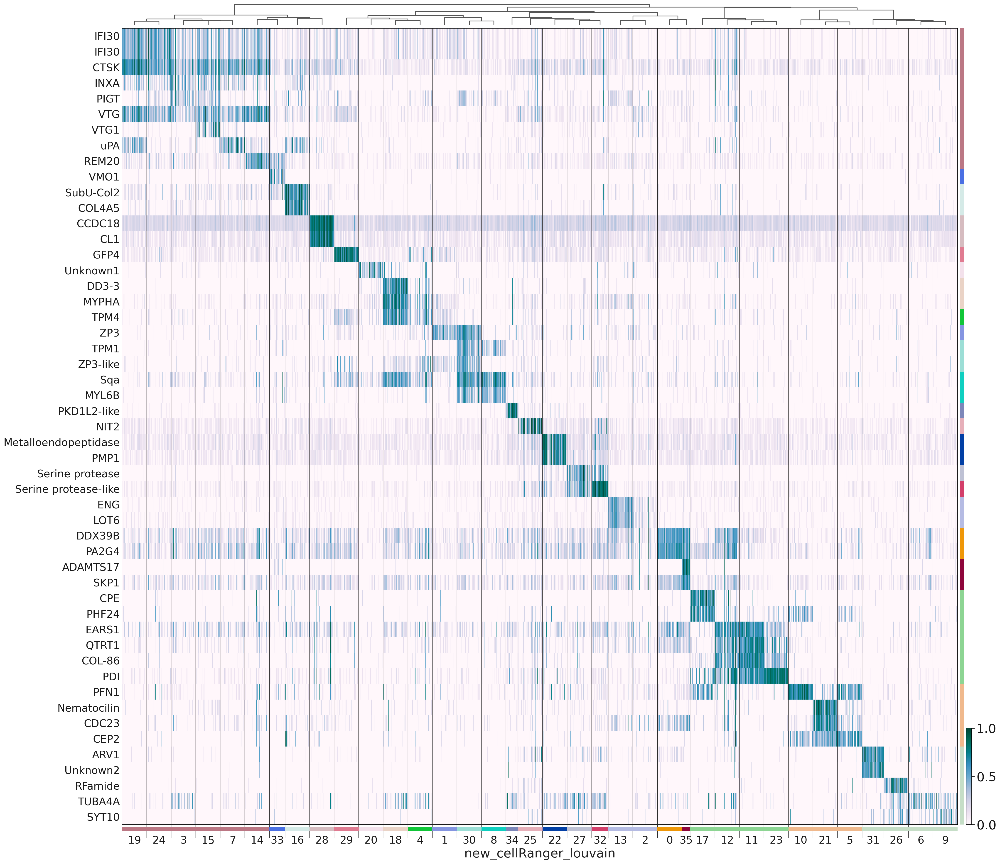

In [ ]:
sc.set_figure_params(scanpy=True, fontsize=25)
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(toPlotSub, names, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='PuBuGn',gene_symbols='names',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (30,30),save='cellAtlas.pdf')

In [ ]:
transpXLOCS = list(pd.read_csv('vfjwgcn1l26m48x46b0tqedb8f2yiarp',header=None)[0])
inRaw = [i for i in transpXLOCS if i in list(bus_fs_raw.var_names)]

toPlot = bus_fs_raw[:,inRaw]
sc.pp.log1p(toPlot)




In [ ]:
# inSig = [i for i in inRaw if i in list(markers_broad[markers_broad.clus == 'Neurons'].markerGene)]
# inSig

['XLOC_040602']

In [ ]:
sc.pl.heatmap(toPlot,inRaw, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              cmap='PuBuGn',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (100,40),save='cellAtlasTransp.pdf')

In [ ]:
gpcrXLOCS = list(pd.read_csv('s43ehjf5wxmku2nb0ht4nraph9iye9ez',header=None)[0])
inRaw = [i for i in gpcrXLOCS if i in list(bus_fs_raw.var_names)]

toPlot = bus_fs_raw[:,inRaw]
sc.pp.log1p(toPlot)

In [ ]:
# inSig = [i for i in inRaw if i in list(markers_broad[markers_broad.clus == 'Neurons'].markerGene)]
# inSig

[]

In [ ]:
sc.pl.heatmap(toPlot,inRaw, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              cmap='PuBuGn',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (30,30),save='cellAtlasTransp.pdf')

In [ ]:
names = pd.read_csv('kl4o9v9623v4izgkt3rarapi7y6b1xpb')
names.head()


,TRINITY,XLOC
0,TRINITY_DN10002_c0_g2_i1.mrna1,XLOC_005744
1,TRINITY_DN10014_c0_g1_i3.mrna1,XLOC_006084
2,TRINITY_DN10015_c0_g2_i1.mrna2,XLOC_000555
3,TRINITY_DN10016_c0_g1_i8.mrna1,XLOC_010986
4,TRINITY_DN10019_c1_g1_i1.mrna1,XLOC_024960


In [ ]:
#'XLOC_037660' in list(bus_fs_raw.var_names)

# 'XLOC_021850' in list(bus_fs_raw.var_names) instead of XLOC_010399

# XLOC_037659 instead of XLOC_037660

genes = ['XLOC_014365','XLOC_039658','XLOC_026179','XLOC_037659','XLOC_014942','XLOC_009450','XLOC_037610','XLOC_035947',
 'XLOC_045755','XLOC_043531','XLOC_039390','XLOC_040602','XLOC_034872','XLOC_021040','XLOC_044379',
 'XLOC_003367','XLOC_010274','XLOC_033853','XLOC_036636','XLOC_021850']

print(len(genes))
inRaw = [i for i in genes if i in list(bus_fs_raw.var_names)]
print(len(inRaw))

20
20


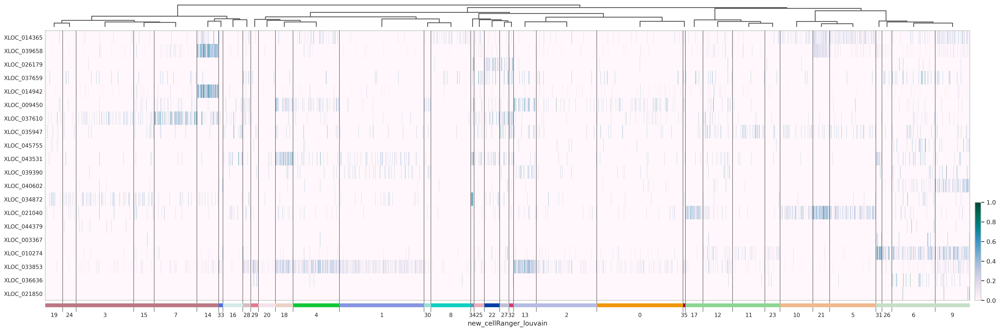

In [ ]:
toPlot = bus_fs_raw[:,inRaw]
sc.pp.log1p(toPlot)

sc.pl.heatmap(toPlot,inRaw, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              cmap='PuBuGn',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (30,10),save='cellAtlasTransp.pdf')

##### Get markers for general cell types


In [ ]:
#Get top n marker genes for each cluster

#Keep top  genes with alpha <0.05, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'annos',n_genes = 1000,method='wilcoxon') #Using non-parametric test for significance


# transpXLOCS = list(pd.read_csv('vfjwgcn1l26m48x46b0tqedb8f2yiarp',header=None)[0])
# inRaw = [i for i in transpXLOCS if i in list(bus_fs_raw.var_names)]

# gpcrXLOCS = list(pd.read_csv('s43ehjf5wxmku2nb0ht4nraph9iye9ez',header=None)[0])
# inRaw2 = [i for i in gpcrXLOCS if i in list(bus_fs_raw.var_names)]

# testEnrich = inRaw+inRaw2

# bus_fs_raw.obs['annos'] = bus_fs_clus.obs['annos']
# toEnrich = bus_fs_raw[:,testEnrich]

# sc.pp.log1p(toEnrich)
# sc.tl.rank_genes_groups(toEnrich, 'annos',n_genes = 100,method='wilcoxon',use_raw=False) #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['annos'])
markers_broad = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers_broad['clus'] = clus
markers_broad['markerGene'] = markerGene
markers_broad['padj'] = padj

markers_broad['orthoGene'] = orthoGene
markers_broad['orthoDescr'] = orthoDescr

markers_broad['pantherID'] = pantherNum
markers_broad['pantherDescr'] = pantherDescr

markers_broad['goTerms'] = goTerms
     
markers_broad.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,AP2 Gland Cells,XLOC_014033,1.762802e-126,NA,NA,[PTHR10127:SF718],[METALLOENDOPEPTIDASE],"[GO:0007498,GO:0005488,GO:0008233,GO:0008237,G..."
1,AP2 Gland Cells,XLOC_030664,1.762802e-126,NA,NA,[PTHR24250],[FAMILY NOT NAMED],[nan]
2,AP2 Gland Cells,XLOC_000637,1.084338e-124,NA,NA,NA,NA,[nan]
3,AP2 Gland Cells,XLOC_036454,4.351232e-122,NA,NA,[PTHR10127:SF718],[METALLOENDOPEPTIDASE],"[GO:0007498,GO:0005488,GO:0008233,GO:0008237,G..."
4,AP2 Gland Cells,XLOC_005904,5.276384e-121,NA,NA,[PTHR24250],[FAMILY NOT NAMED],[nan]


In [ ]:
markers_broad = markers_broad[markers_broad.padj < 0.05]

In [ ]:
topGenes = []
var_groups = []
var_labels = []
ind = 0
n_genes = 5
for i in np.unique(markers_broad.clus):
  sub = markers_broad[markers_broad.clus == i]
  sub.sort_values(by='padj',ascending=True)

  topGenes += list(sub.markerGene[0:n_genes])

  var_groups += [(ind,ind+n_genes-1)]
  var_labels += [str(i)]
  ind += n_genes

In [ ]:
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(bus_fs_raw, topGenes, groupby='annos', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='viridis',standard_scale='var')

In [ ]:
#Write to csv
markers_broad.to_csv('fs_broad_marker_annotations.csv')

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(toEnrich.obs['annos'])
markers_broad = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = toEnrich.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(toEnrich.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers_broad['clus'] = clus
markers_broad['markerGene'] = markerGene
markers_broad['padj'] = padj

markers_broad['orthoGene'] = orthoGene
markers_broad['orthoDescr'] = orthoDescr

markers_broad['pantherID'] = pantherNum
markers_broad['pantherDescr'] = pantherDescr

markers_broad['goTerms'] = goTerms
     
markers_broad.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,AP2 Gland Cells,XLOC_009327,1.777595e-12,RPL28,PREDICTED: 60S ribosomal protein L28 isoform ...,[PTHR10544:SF2],[60S RIBOSOMAL PROTEIN L28],"[GO:0005737,GO:0044238,GO:0005622,GO:0032991,G..."
1,AP2 Gland Cells,XLOC_026179,2.109396e-06,SLC17A9,solute carrier family 17 member 9 isoform 1 [...,[PTHR11662:SF350],[SOLUTE CARRIER FAMILY 17 MEMBER 9],"[GO:0016020,GO:0006810,GO:0016021,GO:0005215,G..."
2,AP2 Gland Cells,XLOC_040052,3.626617e-06,NA,NA,[PTHR12675:SF11],[ZINC FINGER CCCH DOMAIN-CONTAINING PROTEIN 10],"[GO:0032502,GO:0003690,GO:0005488,GO:0003676,G..."
3,AP2 Gland Cells,XLOC_006130,5.809492e-03,NA,NA,[PTHR23507],[FAMILY NOT NAMED],[nan]
4,AP2 Gland Cells,XLOC_041093,3.568979e-02,NA,NA,[PTHR16172],[UNCHARACTERIZED],[nan]


In [ ]:
markers_broad = markers_broad[markers_broad.padj < 0.05]

In [ ]:
#Write to csv
markers_broad.to_csv('fs_broad_marker_annotations_transportGPCRXLOCS.csv')

##### Low Expression marker genes


In [ ]:
#Set threshold for expression cutoff (just using raw counts)
exprThresh = 10 # num of raw counts
percUniqThresh = 0.9

bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])


sc.pp.filter_genes(bus_fs_raw, min_counts=1) #Filter for at least one count 

exprMat = bus_fs_raw.X.toarray()

candidates = {}
gene_names = bus_fs_raw.var_names
for g in range(0,len(gene_names)):#
  #Where is expression nonzero, etc
  ind = np.where(exprMat[:,g] > exprThresh)
  #Get clusters with above thresh expression
  clusNames = pd.Series(bus_fs_raw.obs['cellRanger_louvain'][ind[0]])

  #Highest percent of unique cluster counts
  normVal = clusNames.value_counts(normalize=True)
  maxPerc = np.max(normVal)
  indMax = np.argmax(normVal)
  if maxPerc >= percUniqThresh:
    candidates[gene_names[g]] = normVal.index[indMax] #Save which cluster had expression
    #save maxPerc
    
print(len(candidates))



1004


In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
lowExpr_markers = pd.DataFrame()

markerGene = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []
clus = []


for g in candidates.keys():
        
  markerGene += [g]
  clus += [candidates[g]]

  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']

  if len(panth_df) > 0:
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
  

lowExpr_markers['markerGene'] = markerGene
lowExpr_markers['clus'] = clus

lowExpr_markers['orthoGene'] = orthoGene
lowExpr_markers['orthoDescr'] = orthoDescr

lowExpr_markers['pantherID'] = pantherNum
lowExpr_markers['pantherDescr'] = pantherDescr

lowExpr_markers['goTerms'] = goTerms
      
lowExpr_markers.head()





,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
overlap = list(set(markers.markerGene).intersection(lowExpr_markers.markerGene))

In [ ]:
lowExpr_markers = lowExpr_markers[~lowExpr_markers.markerGene.isin(overlap)]
lowExpr_markers.head()

,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
len(lowExpr_markers)

765

In [ ]:
lowExpr_markers.to_csv('fs_lowExpr_markers_atlas.csv')

###**DE Gene Analysis Across Clusters**

In [ ]:
#Remove clusters with < 10 cells per condition
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")

bus_fs_raw = bus_fs_raw[bus_fs_clus.obs_names,]
#bus_fs_raw.obs['orgID'] = bus_fs_clus.obs['orgID']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw


#clusSize

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

In [ ]:
def clusToKeep(bus_fs_clus):
  keep = []
  clusSize = {}
  for i in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
      cells = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([i])]
      fed_cells = len(cells[cells.obs['fed']==True].obs_names)
      starv_cells = len(cells[cells.obs['fed']==False].obs_names)
      min_cells = np.min([fed_cells,starv_cells])
      if min_cells > 10:
        keep += [i]
        #clusSize[i] = min_cells
  return keep

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

In [ ]:
#Subsample from full dataset, across each cluster
def getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep):

  subSample = 100
  cellNames = np.array(bus_fs_clus.obs_names)
  fed = np.array(list(bus_fs_clus.obs['fed'] == True))
  starv = np.array(list(bus_fs_clus.obs['fed'] == False))
  #di = np.array(list(jelly4Raw.obs['condition'] == 'DI'))

  allCells = []
  for i in keep:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(bus_fs_clus.obs['cellRanger_louvain'].isin([i])))
      fed_cells = list(np.where(fed & cells)[0])
      starv_cells = list(np.where(starv & cells)[0])
      
      #Take all cells if < subSample
      if len(fed_cells) >= subSample:
          fed_choice = random.sample(fed_cells,subSample)
      else:
          fed_choice = fed_cells
          
      if len(starv_cells) >= subSample:
          starv_choice = random.sample(starv_cells,subSample)
      else:
          starv_choice = starv_cells
          
          
      pos = list(fed_choice)+list(starv_choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub_raw = bus_fs_raw[allCells,:]
  return sub_raw

View of AnnData object with n_obs × n_vars = 6026 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

In [ ]:
#For full dataset don't filter by highly variable
keep = clusToKeep(bus_fs_clus)
sub_raw = getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep)


sub_raw_copy = sub_raw.copy()
sc.pp.filter_cells(sub_raw, min_counts=0)
sc.pp.filter_genes(sub_raw, min_counts=0)
sc.pp.normalize_per_cell(sub_raw_copy, counts_per_cell_after=1e4)
sub_raw_copy.raw = sc.pp.log1p(sub_raw_copy, copy=True)

sc.pp.highly_variable_genes(sub_raw_copy,n_top_genes=5000) #This is just a small example, for full data used all nonzero genes
sub_raw = sub_raw[:,sub_raw_copy.var['highly_variable']]


In [ ]:
#Instantiate dataframe with gene names
def makeDF_forR(sub_raw):
  fullDF = pd.DataFrame(scipy.sparse.csr_matrix.toarray(sub_raw.X).T, index = sub_raw.var_names.tolist(), columns= sub_raw.obs_names.tolist())
  conds = sub_raw.obs['fed'].tolist()
  #ids = sub_jelly4Raw.obs['orgID'].tolist()
  clus = sub_raw.obs['cellRanger_louvain'].tolist()

  reps = np.repeat(0,len(sub_raw.obs_names))

  length = len(sub_raw[sub_raw.obs['fed'] == True].obs_names)
  reps[sub_raw.obs['fed'] == True] = range(1,length+1)

  length = len(sub_raw[sub_raw.obs['fed'] == False].obs_names)
  reps[sub_raw.obs['fed'] == False] = range(1,length+1)


  sampleDF = pd.DataFrame({'cell_ID': fullDF.columns}) \
          .assign(condition = conds) \
          .assign(replicate = reps) \
          .assign(cluster = clus) 
  sampleDF.index = sampleDF.cell_ID
  sampleDF.head()

  fullDF.to_csv('fullDF.csv')
  sampleDF.to_csv('sampleDF.csv')

,cell_ID,condition,replicate,cluster
cell_ID,,,,
CGACCTTCACGCGAAA-2,CGACCTTCACGCGAAA-2,True,1,0
CACCTTGAGAAGATTC-1,CACCTTGAGAAGATTC-1,True,2,0
ATCCGAACAGCCTTGG-2,ATCCGAACAGCCTTGG-2,True,3,0
AGATTGCAGTTGTCGT-1,AGATTGCAGTTGTCGT-1,True,4,0
CATTCGCTCAGCTGGC-2,CATTCGCTCAGCTGGC-2,True,5,0


In [ ]:
makeDF_forR(sub_raw)

In [ ]:
%%R 
fullDF <- read.csv(file = 'fullDF.csv')
sampleDF <- read.csv(file = 'sampleDF.csv')
head(sampleDF)

In [ ]:
%%R
rownames(sampleDF) <- sampleDF$cell_ID 
#Replace '.' in cell barcodes with '-'
rownames(fullDF) <- fullDF$X
colnames(fullDF) <- gsub("\\.", "-", colnames(fullDF))
fullDF <- subset(fullDF, select = -c(X) )
head(fullDF)

sampleDF <- subset(sampleDF, select = -c(cell_ID.1) )
# head(sampleDF)
sampleDF$condition <- factor(sampleDF$condition, labels = c("starved", "fed"))

In [ ]:
%%R
install.packages("BiocManager")
BiocManager::install(version = "3.10")


R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/BiocManager_1.30.10.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 40205 bytes (39 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[


Error: Bioconductor version '3.10' requires R version '3.6'; see
  https://bioconductor.org/install


In [ ]:
!sudo apt-get update
!sudo apt-get install libxml2-dev
!sudo apt-get install r-cran-xml
!sudo apt-get install libcurl4-openssl-dev

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:6 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:7 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Ign:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:9 http://security.ubuntu.com/ubuntu bionic-security/multiverse amd64 Packages [15.0 kB]
Get:10 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [1,348 kB]
Ign:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Releas

In [ ]:
%%R 
#install.packages("DESeq2",repos = "http://cran.us.r-project.org")
BiocManager::install("DESeq2")

R[write to console]: Bioconductor version 3.11 (BiocManager 1.30.10), R 4.0.2 (2020-06-22)

R[write to console]: Installing package(s) 'BiocVersion', 'DESeq2'

R[write to console]: also installing the dependencies ‘bit’, ‘bitops’, ‘formatR’, ‘bit64’, ‘plogr’, ‘RCurl’, ‘GenomeInfoDbData’, ‘zlibbioc’, ‘matrixStats’, ‘lambda.r’, ‘futile.options’, ‘RSQLite’, ‘xtable’, ‘GenomeInfoDb’, ‘XVector’, ‘DelayedArray’, ‘futile.logger’, ‘snow’, ‘AnnotationDbi’, ‘annotate’, ‘S4Vectors’, ‘IRanges’, ‘GenomicRanges’, ‘SummarizedExperiment’, ‘BiocGenerics’, ‘Biobase’, ‘BiocParallel’, ‘genefilter’, ‘locfit’, ‘geneplotter’, ‘RcppArmadillo’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/bit_4.0.4.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 279723 bytes (273 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to con

In [ ]:
#Make output directory
!mkdir kallistoDEAnalysis_Starv

In [ ]:
%%R 
install.packages("DESeq2",repos = "http://cran.us.r-project.org")
library("DESeq2")

#library("apeglm")
#library(Rcpp)
#.libPaths()

clusters <- unique(sampleDF$cluster)
Genes <- c()
Cluster <- c()
Condition <- c() 
padj <- c()
log2FC <- c()

for (i in clusters){
 
        indices = which(sampleDF$cluster == i)
        subset = fullDF[,indices]
        subset_meta = subset(sampleDF,cluster == i)


        dds <- DESeqDataSetFromMatrix(countData = subset, colData = subset_meta, design= ~replicate + condition)

        #Set control condition
        dds$condition <- relevel(dds$condition, ref = 'fed')
        dds <- DESeq(dds,test="LRT", reduced=~replicate, sfType="poscounts", useT=TRUE, minmu=1e-6, 
                     minReplicatesForReplace=Inf,betaPrior = FALSE)#parallel = TRUE

        #Starv v Fed results
        res <- results(dds,alpha=0.05,name="condition_starved_vs_fed")
        resLFC <- res 

        resLFC <- na.omit(resLFC)
        resOrdered <- resLFC[resLFC$padj < .05,]
        #Keep log2 fold changes < -1 or > 1
        resOrdered <- resOrdered[abs(resOrdered$log2FoldChange) > 1,] 
        outcomes <- resOrdered[order(resOrdered$padj),]

        Genes <- c(Genes,row.names(outcomes))
        Cluster <- c(Cluster,rep(i,length(row.names(outcomes))))
        Condition <- c(Condition,rep('Starved',length(row.names(outcomes)))) 
        padj <- c(padj,outcomes$padj)
        log2FC <- c(log2FC,outcomes$log2FoldChange)
         
    
}

deGenesDF <- data.frame(matrix(ncol = 6, nrow = length(Genes)))
names(deGenesDF) <- c("Genes", "Cluster", "Condition","padj","padjClus","log2FC")

deGenesDF$Genes <- Genes
deGenesDF$Cluster <- Cluster
deGenesDF$Condition <- Condition
deGenesDF$padj <- padj
deGenesDF$padjClus <- padj*length(unique(Cluster))
deGenesDF$log2FC <- log2FC

write.csv(deGenesDF,'./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv')

head(deGenesDF)

In [ ]:
%%R -w 20 -h 20 --units in -r 500
install.packages("UpSetR",repos = "http://cran.us.r-project.org")
#Cite http://people.seas.harvard.edu/~alex/papers/2014_infovis_upset.pdf
library("UpSetR")

deGenesDF <- read.csv(file = 'vy27o8yx0tb1ub3ifug770y32kr8o833') #./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv

#Bonferronni correction across clusters
deGenesDF_toPlot = subset(deGenesDF,padjClus < .05)
#deGenesDF_toPlot = subset(deGenesDF_toPlot,abs(log2FC) < 10) #Remove genes from plot that are inflated by zero expression in other cells

# Create empty list to store vectors
vecsToPlot <- list()

clusters = unique(deGenesDF_toPlot$Cluster)
for (i in 1:length(clusters)){
    subset = subset(deGenesDF_toPlot,Cluster == clusters[i])
    vecsToPlot[[i]] <- unique(subset$Genes)
}

names(vecsToPlot) <- clusters

upset(fromList(vecsToPlot), sets = as.character(clusters),nintersects= NA,order.by = "freq",
      mainbar.y.label='',
      sets.x.label = '',
      text.scale = c(1.5, 2, 1.5, 2, 1.3, 1.3),
      show.numbers = "no",
      point.size = 2.8,
      mb.ratio= c(0.6, 0.4),
      queries = list(list(query = intersects, params = list("0"), color = "firebrick",active = T),
                     list(query = intersects, params = list("6"), color = "firebrick",active = T),
                     list(query = intersects, params = list("3"), color = "firebrick",active = T),
                     list(query = intersects, params = list("9"), color = "firebrick",active = T),
                     list(query = intersects, params = list("14"), color = "firebrick",active = T),
                     list(query = intersects, params = list("15"), color = "firebrick",active = T),
                     list(query = intersects, params = list("19"), color = "firebrick",active = T),
                     list(query = intersects, params = list("8"), color = "firebrick",active = T),
                     list(query = intersects, params = list("7"), color = "firebrick",active = T),
                     list(query = intersects, params = list("28"), color = "firebrick",active = T),
                     list(query = intersects, params = list("5"), color = "firebrick",active = T),
                     list(query = intersects, params = list("21"), color = "firebrick",active = T),
                     list(query = intersects, params = list("16"), color = "firebrick",active = T),
                     list(query = intersects, params = list("18"), color = "firebrick",active = T),
                     list(query = intersects, params = list("22"), color = "firebrick",active = T),
                     list(query = intersects, params = list("24"), color = "firebrick",active = T),
                     list(query = intersects, params = list("27"), color = "firebrick",active = T),
                     list(query = intersects, params = list("29"), color = "firebrick",active = T),
                     list(query = intersects, params = list("30"), color = "firebrick",active = T),
                     list(query = intersects, params = list("32"), color = "firebrick",active = T),
                     list(query = intersects, params = list("33"), color = "firebrick",active = T),
                     list(query = intersects, params = list("34"), color = "firebrick",active = T),
                     list(query = intersects, params = list("35"), color = "firebrick",active = T),
                     list(query = intersects, params = list("10"), color = "firebrick",active = T),
                     list(query = intersects, params = list("11"), color = "firebrick",active = T),
                     list(query = intersects, params = list("12"), color = "firebrick",active = T),
                     list(query = intersects, params = list("17"), color = "firebrick",active = T),
                     list(query = intersects, params = list("23"), color = "firebrick",active = T),
                     list(query = intersects, params = list("26"), color = "firebrick",active = T),
                     list(query = intersects, params = list("31"), color = "firebrick",active = T)))

In [ ]:
deseq_df = pd.read_csv('./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv',
            sep=",")
deseq_df.head()

In [ ]:
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []


for g in deseq_df.Genes:
        
  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']


  if len(panth_df) > 0:
    #Save first result for gene/description
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    #Save first result for gene/description
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
 
deseq_df['orthoGene'] = orthoGene
deseq_df['orthoDescr'] = orthoDescr

deseq_df['pantherID'] = pantherNum
deseq_df['pantherDescr'] = pantherDescr

deseq_df['goTerms'] = goTerms
deseq_df.head()

In [ ]:
deseq_df.to_csv('deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

### **Cluster DE Genes by Expression**

In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,XLOC_005629,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0


In [ ]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05]

In [ ]:
#Filter raw count dataset
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
bus_fs_raw = bus_fs_raw [:,np.unique(deGenesDF_sig.Genes)]
bus_fs_raw =bus_fs_raw[bus_fs_clus.obs_names,:]
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']

Trying to set attribute `.obs` of view, copying.


In [ ]:
de_gene_adata = anndata.AnnData(X=bus_fs_raw.X.T)
de_gene_adata.var_names = bus_fs_raw.obs_names
de_gene_adata.obs_names = bus_fs_raw.var_names

de_gene_adata_orig = de_gene_adata.copy()
#de_gene_adata

numIntersects = deGenesDF['Genes'].value_counts()
num_intersect = []
for g in de_gene_adata.obs_names: 
    num_intersect += [numIntersects[g]]
    
de_gene_adata.obs['numIntersects'] = pd.Categorical(num_intersect)
#de_gene_adata

de_gene_adata

AnnData object with n_obs × n_vars = 957 × 13673
    obs: 'numIntersects'

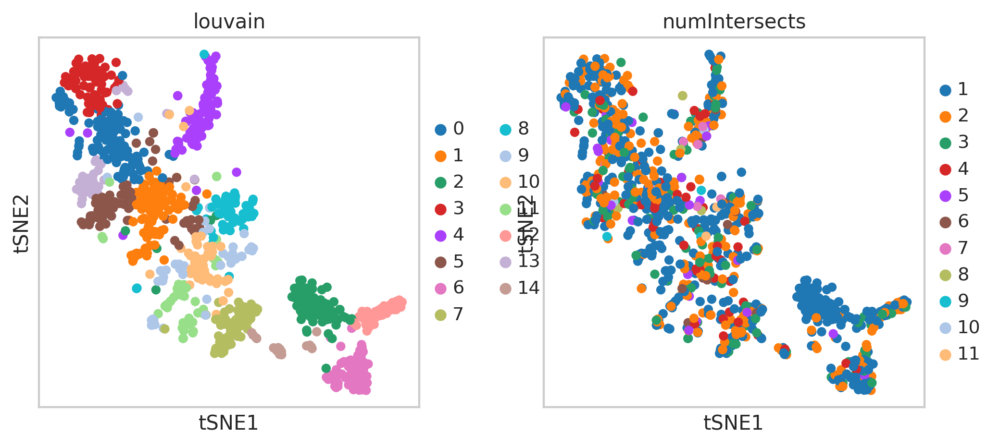

In [ ]:
#Normalize and scale data
sc.pp.filter_genes(de_gene_adata, min_counts=0)

sc.pp.normalize_per_cell(de_gene_adata, counts_per_cell_after=1e4)
de_gene_adata.raw = sc.pp.log1p(de_gene_adata, copy=True)

sc.pp.scale(de_gene_adata, max_value=10)
sc.tl.pca(de_gene_adata, n_comps=60,random_state=42)
#sc.pl.pca_variance_ratio(bus_combo, log=True)

#Determine neighbors for clustering
sc.pp.neighbors(de_gene_adata,n_neighbors=20, n_pcs=15) #n_neighbors=5, n_pcs=15,  20, n_pcs=15
sc.tl.louvain(de_gene_adata,resolution=2)

sc.tl.tsne(de_gene_adata, n_pcs=15,random_state=42)
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])



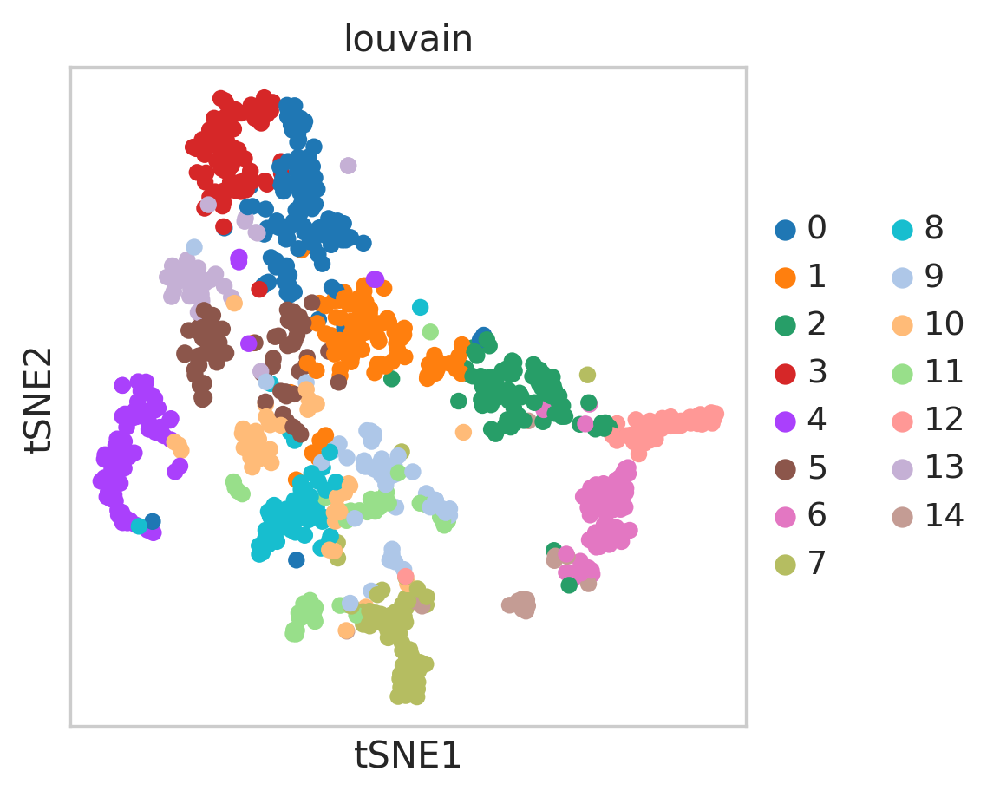

In [ ]:
sc.tl.tsne(de_gene_adata, n_pcs=10,random_state=42,perplexity=15) #10, 30
sc.pl.tsne(de_gene_adata,color=['louvain'])

In [ ]:
clusters = []
for g in deGenesDF.Genes:
  if g in list(de_gene_adata.obs_names):
    clus = de_gene_adata[g,:].obs['louvain'][0]
    clusters += [clus]
  else:
    clusters += ['padjClus_not_sig']

deGenesDF['geneClus'] = clusters
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,XLOC_005629,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",5


In [ ]:
deGenesDF.to_csv('atlas_deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

In [ ]:
print(de_gene_adata[de_gene_adata.obs_names == 'XLOC_043836'].obs['louvain'])
de_gene_adata[de_gene_adata.obs_names == 'XLOC_043846'].obs['louvain']

XLOC_043836    7
Name: louvain, dtype: category
Categories (1, object): ['7']


XLOC_043846    7
Name: louvain, dtype: category
Categories (1, object): ['7']

In [ ]:
#For topGO analysis

def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]
deGenesDF = deGenesDF[deGenesDF.goTerms != 'nan']
deGenesDF = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

deGenesDF.to_csv('atlas_deseq2_genes_fortopGO_metadata.txt',sep='\t',columns=['Genes','goTerms','geneClus'],
             header=None,index_label=False,index=False)
deGenesDF.to_csv('atlas_deseq2_genes_fortopGO.txt',sep='\t',columns=['Genes','goTerms'],
             header=None,index_label=False,index=False)


In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833') #UPDATE
deGenesDF.head()

#### DE Genes Across Clusters and in Dig Endoderm Clusters 14 and 19

In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()



,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,TRINITY_DN4299_c0_g1_i1.mrna1,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0


In [ ]:
#Based on saved topGO output (See script....)
c = np.unique(de_gene_adata.obs["louvain"].values)
print(c)




['0' '1' '10' '11' '12' '13' '14' '2' '3' '4' '5' '6' '7' '8' '9']


In [ ]:
names = ['RNA Transcription & Splicing','Metabolic Process','Cyotskeletal','NA','Synaptic Transmission & Transport','Electron Transport',
         'NA','Cell Cycle Oocyte','Protein Synthesis & Transport',
         'Protein Folding','Oxidative Phsophorylation','Cell-Matrix Adhesion','Metabolic/Proteolytic','Cell Cycle',
         'Metabolic Process 2']

geneClusNames = dict(zip(c, names)) 

In [ ]:
addNames = []
deGenesDF_sig = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

for i in deGenesDF_sig.geneClus:
  addNames += [geneClusNames[i]]

deGenesDF_sig['names'] = addNames
deGenesDF_sig.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus,names
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"GO:0030246,GO:0005488",0,RNA Transcription & Splicing
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"GO:0016070,GO:0006139,GO:0016072,GO:0005622,GO...",0,RNA Transcription & Splicing
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"GO:0005215,GO:0005216,GO:0006810,GO:0051179,GO...",5,Oxidative Phsophorylation
5,37,37,37,38,XLOC_015223,0,Starved,1.280000e-08,4.490000e-07,-1.531169,CBR1,carbonyl reductase [NADPH] 1 isoform 1 [Homo ...,['PTHR43490:SF4'],['CARBONYL REDUCTASE 1-RELATED'],"GO:0044238,GO:0006629,GO:0003824,GO:0008152,GO...",1,Metabolic Process
6,38,38,38,39,XLOC_010709,0,Starved,1.610000e-08,5.630000e-07,-1.791829,AMD1,S-adenosylmethionine decarboxylase proenzyme ...,['PTHR11570:SF8'],['S-ADENOSYLMETHIONINE DECARBOXYLASE PROENZYME'],"GO:0005737,GO:0016829,GO:0009987,GO:0044464,GO...",0,RNA Transcription & Splicing


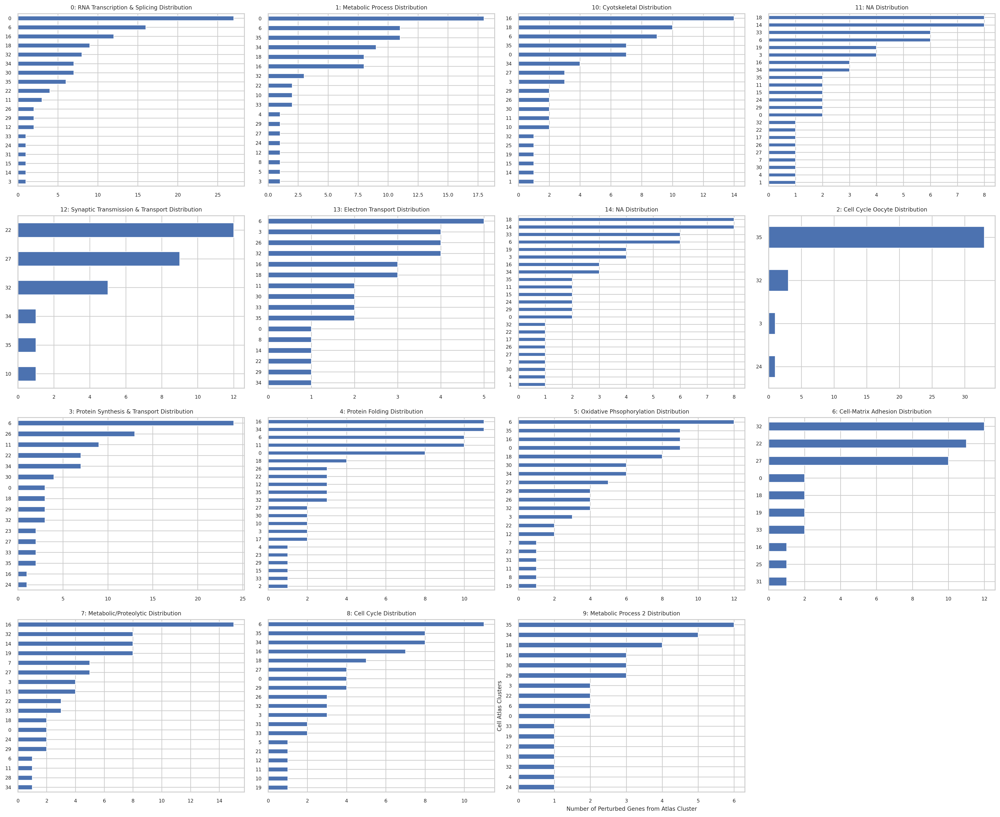

In [ ]:
#https://stackoverflow.com/questions/29530355/plotting-multiple-histograms-in-grid

def draw_histograms(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(20,20))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        name = geneClusNames[var_name]
        sub = df[df['names'] == name]
        sub.Cluster.value_counts().sort_values().plot(kind = 'barh',ax=ax,fontsize = 7)
        #sub['Cluster'].hist(bins=10,ax=ax)
        ax.set_title(var_name+': '+name+" Distribution",fontsize = 8)
    fig.tight_layout()  # Improves appearance a bit.
    plt.ylabel("Cell Atlas Clusters",fontsize = 8)
    plt.xlabel("Number of Perturbed Genes from Atlas Cluster",fontsize = 8)
    plt.show()

draw_histograms(deGenesDF_sig, np.unique(deGenesDF_sig.geneClus), 5, 4)





# de_gene_adata


In [ ]:
def returnDE(i,names):
  if i in list(names):
    return 'DE'
  else:
    return 'nonSig'


In [ ]:

clus14Genes = deGenesDF[deGenesDF.Cluster == 14]
clus19Genes = deGenesDF[deGenesDF.Cluster == 19]
clus35Genes = deGenesDF[deGenesDF.Cluster == 35]

In [ ]:
clus35Labels = [returnDE(i,np.unique(clus35Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus35'] = pd.Categorical(clus35Labels)

clus14Labels = [returnDE(i,np.unique(clus14Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus14'] = pd.Categorical(clus14Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus14'])

In [ ]:
clus19Labels = [returnDE(i,np.unique(clus19Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus19'] = pd.Categorical(clus19Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus19'])

In [ ]:
np.unique(de_gene_adata.obs["louvain"].values)

array(['0', '1', '10', '11', '12', '13', '14', '2', '3', '4', '5', '6',
       '7', '8', '9'], dtype=object)

#### Gene Module Plot

In [ ]:
c = list(np.unique(de_gene_adata.obs["louvain"].values))
names = ['RNA Transcription & Splicing','Metabolic Process','Cyotskeletal','NA','Synaptic Transmission & Transport','Electron Transport',
         'NA','Cell Cycle Oocyte','Protein Synthesis & Transport',
         'Protein Folding','Oxidative Phsophorylation','Cell-Matrix Adhesion','Metabolic/Proteolytic','Cell Cycle',
         'Metabolic Process 2']

geneClusDict = {}
for i in range(0,len(c)):
  geneClusDict[c[i]] = names[i]


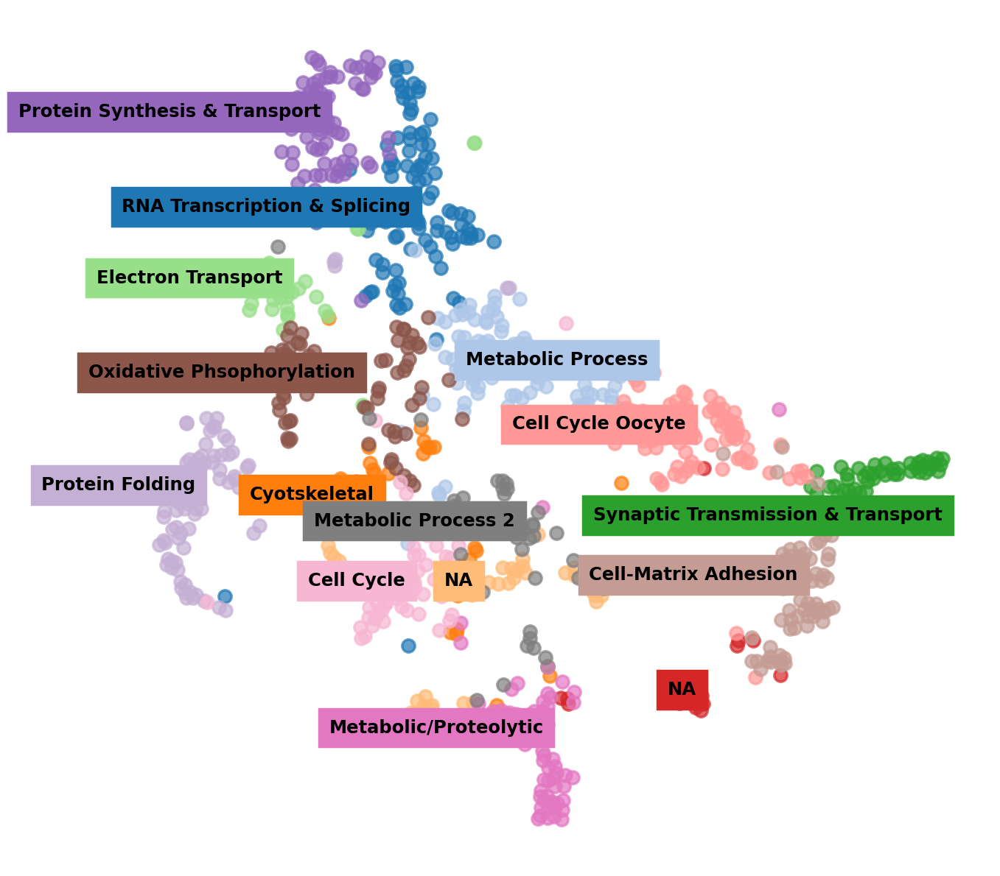

In [57]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")

# names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
#          'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
#          'RNA Splicing','Cell Cycle','Cytoskeletal']

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = de_gene_adata[de_gene_adata.obs.louvain == cluster,:].obsm["X_tsne"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.7)

    if name == 'Metabolic Process':
      ax.annotate(name, 
              (np.max(x)+5, np.median(y)),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=7, weight='bold',
              color="black",
                backgroundcolor=cmap(idx) )
    elif name == 'Synaptic Transmission & Transport':
      ax.annotate(name, 
              (np.max(x), np.median(y)-8),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=7, weight='bold',
              color="black",
                backgroundcolor=cmap(idx) )
    else:
      ax.annotate(name, 
              (np.median(x), np.median(y)),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=7, weight='bold',
              color="black",
                backgroundcolor=cmap(idx) )
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

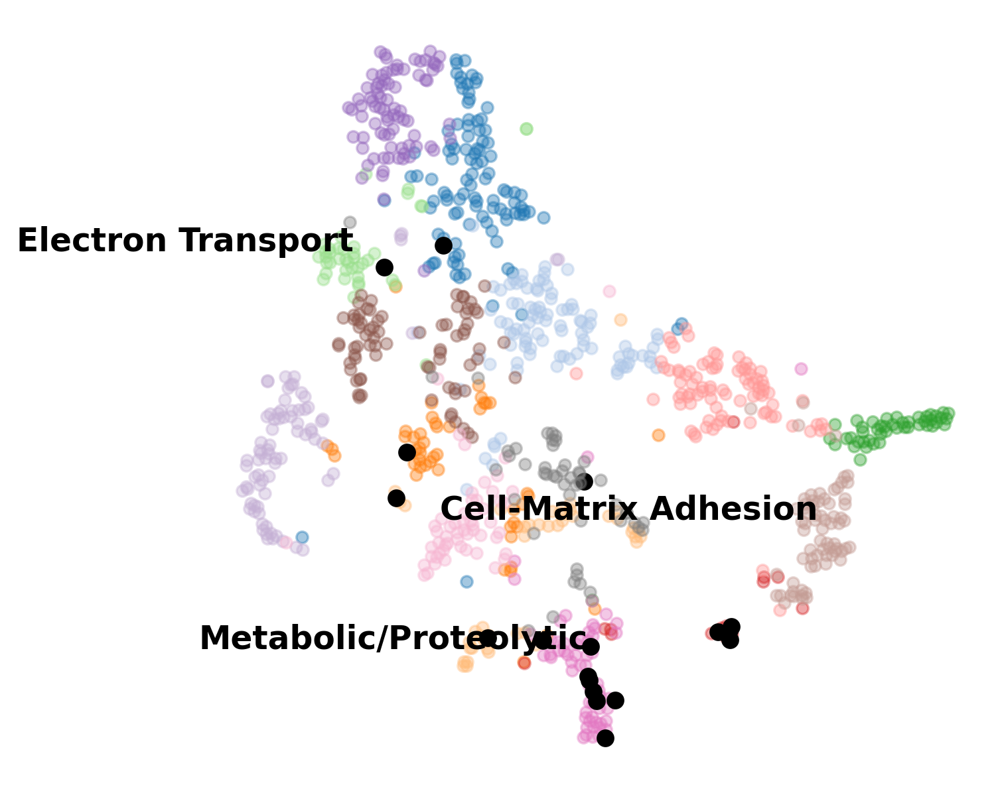

In [60]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")

# names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
#          'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
#          'RNA Splicing','Cell Cycle','Cytoskeletal']

#de = np.unique(de_gene_adata.obs["clus14"].values)

for idx, (cluster, name) in enumerate(zip(c, names)):
    sub = de_gene_adata[de_gene_adata.obs.louvain == cluster,:]
    XX = sub[sub.obs['clus14'] == 'nonSig'].obsm["X_tsne"]
    XX_DE = sub[sub.obs['clus14'] == 'DE'].obsm["X_tsne"]
    

    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.4)

    x_DE = XX_DE[:,0]
    y_DE = XX_DE[:,1]
    ax.scatter(x_DE, y_DE, color = 'black', label=cluster,s=45)

    if name in ['Cell-Matrix Adhesion', 'Electron Transport','Metabolic/Proteolytic']:
      ax.annotate(name, 
              (np.median(x), np.median(y)),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=14, weight='bold',
              color='black')
    
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

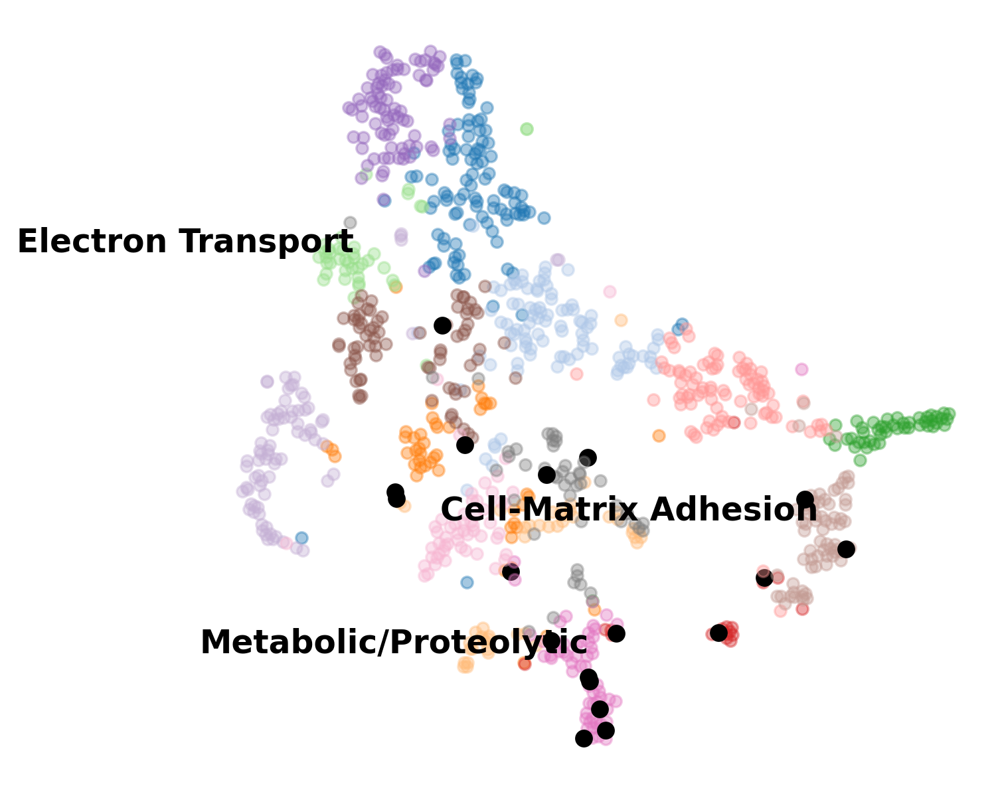

In [61]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")

# names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
#          'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
#          'RNA Splicing','Cell Cycle','Cytoskeletal']

#de = np.unique(de_gene_adata.obs["clus14"].values)

for idx, (cluster, name) in enumerate(zip(c, names)):
    sub = de_gene_adata[de_gene_adata.obs.louvain == cluster,:]
    XX = sub[sub.obs['clus19'] == 'nonSig'].obsm["X_tsne"]
    XX_DE = sub[sub.obs['clus19'] == 'DE'].obsm["X_tsne"]
    

    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.4)

    x_DE = XX_DE[:,0]
    y_DE = XX_DE[:,1]
    ax.scatter(x_DE, y_DE, color = 'black', label=cluster,s=45)

    if name in ['Cell-Matrix Adhesion', 'Electron Transport','Metabolic/Proteolytic']:
      ax.annotate(name, 
              (np.median(x), np.median(y)),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=14, weight='bold',
              color='black')
    
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

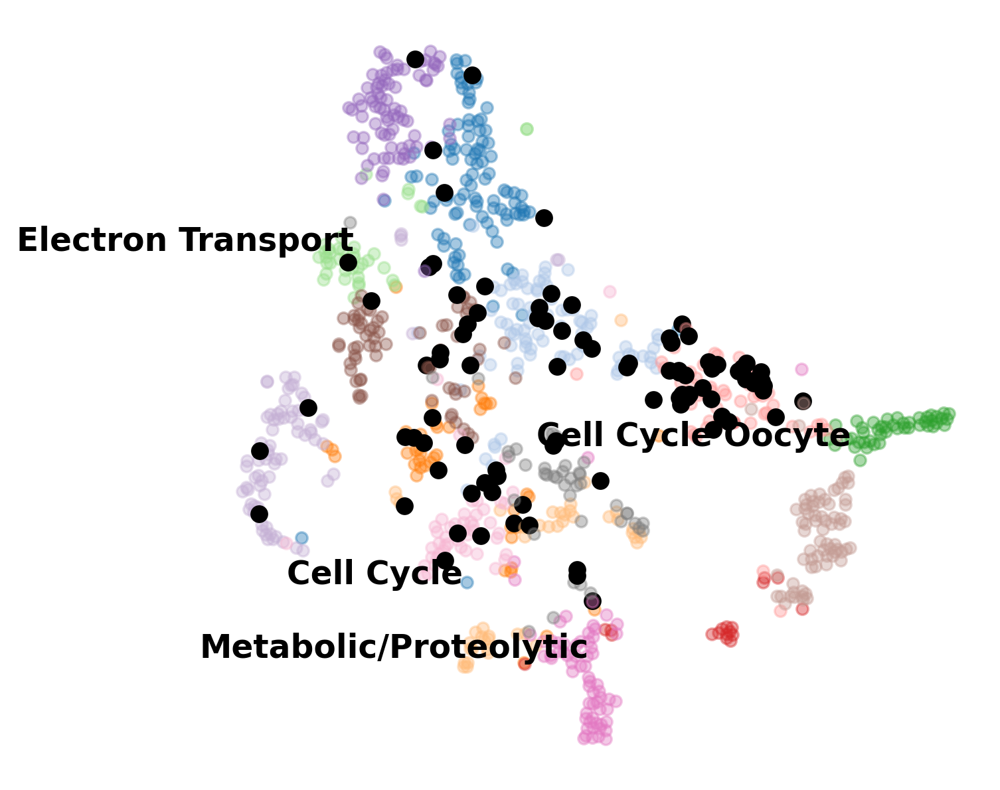

In [72]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")

# names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
#          'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
#          'RNA Splicing','Cell Cycle','Cytoskeletal']

#de = np.unique(de_gene_adata.obs["clus14"].values)

for idx, (cluster, name) in enumerate(zip(c, names)):
    sub = de_gene_adata[de_gene_adata.obs.louvain == cluster,:]
    XX = sub[sub.obs['clus35'] == 'nonSig'].obsm["X_tsne"]
    XX_DE = sub[sub.obs['clus35'] == 'DE'].obsm["X_tsne"]
    

    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.4)

    x_DE = XX_DE[:,0]
    y_DE = XX_DE[:,1]
    ax.scatter(x_DE, y_DE, color = 'black', label=cluster,s=45)

    if name in ['Matrix/Cell Adhesion', 'Electron Transport','Metabolic/Proteolytic',
                'RNA Splicing']:
      ax.annotate(name, 
              (np.median(x), np.median(y)),
              horizontalalignment='right',
              verticalalignment='bottom',
              size=14, weight='bold',
              color='black')
      
    if name in ['Cell Cycle']:
      ax.annotate(name, 
                  (np.mean(x), np.median(y)-10),
                  horizontalalignment='right',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color='black')

    if name in ['Cell Cycle Oocyte']:
      ax.annotate(name, 
                  (np.max(x)+5, np.median(y)-10),
                  horizontalalignment='right',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color='black')
    
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

In [73]:
de_gene_adata.write('de_gene_clus_adata.h5ad')

#### **For SplitsTree Conversion**

In [75]:
from sklearn.metrics import pairwise_distances

#Centroids of cell atlas/defined clusters
def getClusCentroids(overlap_combo,pcs=60,clusType='knn_clus'):
    clusters = np.unique(overlap_combo.obs[clusType])
    centroids = np.zeros((len(clusters),pcs))
    
    for c in clusters:
        
        sub_data = overlap_combo[overlap_combo.obs[clusType] == c]
        pca_embed = sub_data.obsm['X_pca'][:,0:pcs]
        centroid = pca_embed.mean(axis=0)
        
        centroids[int(c),:] = list(centroid)
        
    return centroids

#Compare to pairwise distances between cell atlas clusters
centroids = getClusCentroids(de_gene_adata,60,'louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(15, 15)

In [77]:
df = pd.DataFrame(pairCentroid_dists)
clus = np.unique(de_gene_adata.obs['louvain'])
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in de_gene_adata.obs['louvain']]

names = [geneClusDict[str(i)] for i in df['cluster']]

df['annos'] = names

df.to_csv('geneClustDist_SplitsTree.csv')
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,cluster,annos
0,0.000000,91.790068,128.500515,79.680421,141.865949,102.303390,156.018610,155.245436,145.666313,167.061327,127.465531,154.814629,176.733873,83.832955,228.214426,0,RNA Transcription & Splicing
1,91.790068,0.000000,133.268748,100.180975,138.274716,96.095806,151.229386,145.286939,137.883214,148.634136,119.544893,163.058282,156.983072,86.225661,218.257684,1,Metabolic Process
2,128.500515,133.268748,0.000000,144.932193,166.091241,149.413319,142.115098,151.669920,168.158567,173.946175,137.999244,174.210976,167.046440,141.209080,218.019826,2,Cell Cycle Oocyte
3,79.680421,100.180975,144.932193,0.000000,141.217994,113.143115,162.682343,155.965387,153.260453,178.739821,129.744499,178.167183,177.597529,55.324494,227.295891,3,Protein Synthesis & Transport
4,141.865949,138.274716,166.091241,141.217994,0.000000,120.779490,189.402031,170.104039,171.555345,178.674435,126.872589,177.495182,194.180798,118.647555,239.531300,4,Protein Folding


##### Cluster 14 & 19 DE Gene Comparisons/Violin Plots

In [ ]:
overlap = list(set(np.unique(clus19Genes.Genes)).intersection(np.unique(clus14Genes.Genes)))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


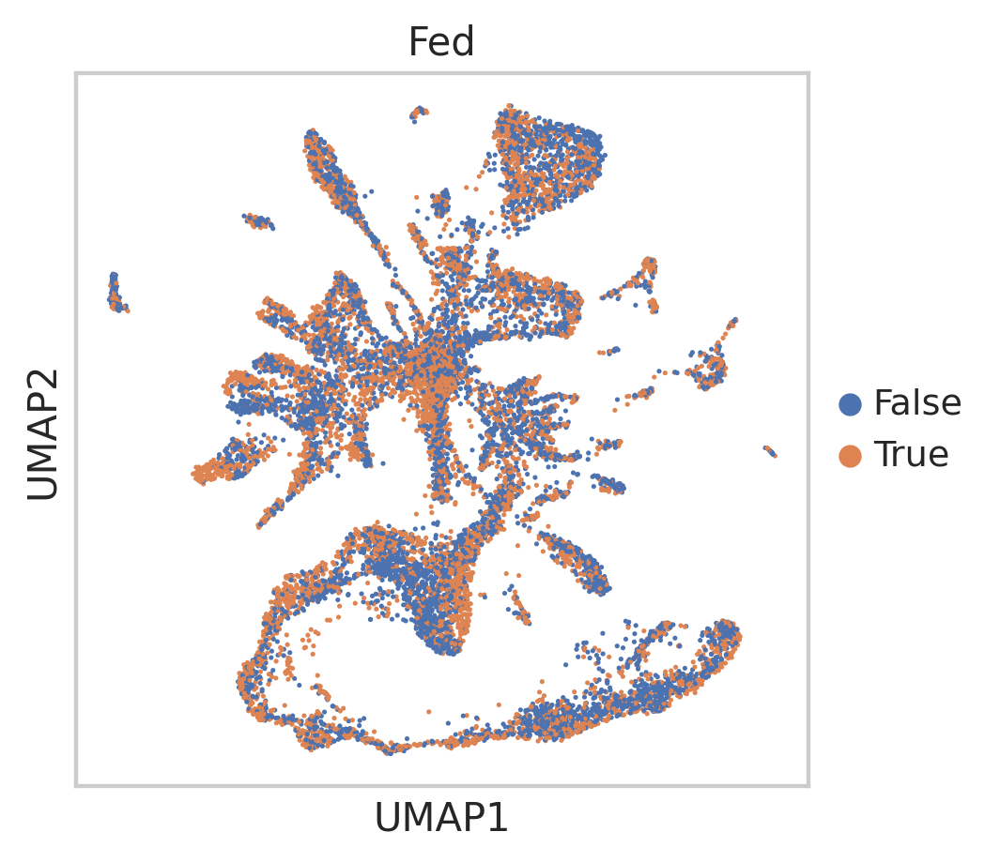

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [ ]:
bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus, color='Fed')

clus14 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([14])]
clus14.obs['Condition2'] = pd.Categorical(clus14.obs['fed'])
clus19 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([19])]
clus19.obs['Condition2'] = pd.Categorical(clus19.obs['fed'])

# sub = deGenesDF[deGenesDF.Genes.isin(overlap)]
# sub = sub[sub.Cluster.isin([14,19])]
# sub.padj = sub.padj*2 #Bonferroni correction
# sub = sub[sub.padj < 0.05] 

newOfInterest = ['XLOC_043836','XLOC_043846','XLOC_007437','XLOC_009798']


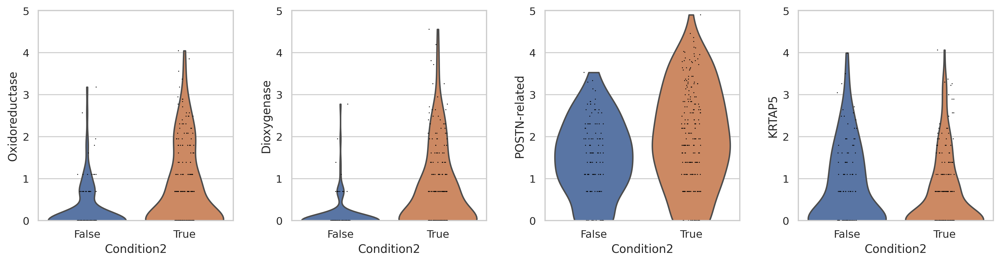

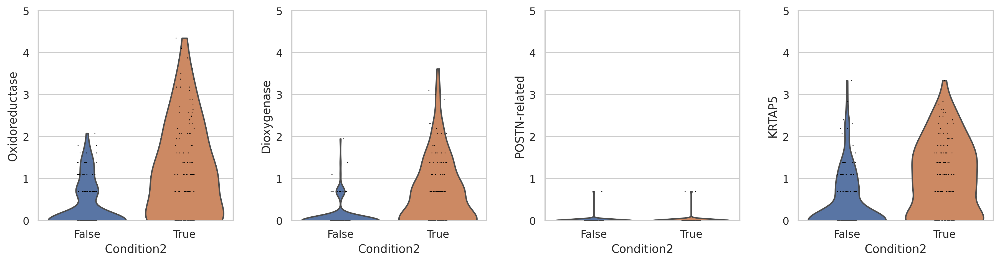

In [ ]:
axes = sc.pl.violin(clus14, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase','POSTN-related','KRTAP5'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)
axes = sc.pl.violin(clus19, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase','POSTN-related','KRTAP5'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)

In [ ]:
# sub14 = clus14Genes[~clus14Genes.Genes.isin(overlap)]
# sub14.padj = sub14.padj*2
# sub14 = sub14[sub14.padj < 0.05]

# sc.pl.stacked_violin(clus14, list(np.unique(sub14.Genes)), groupby='fed',standard_scale='var')
# sc.pl.stacked_violin(clus19, list(np.unique(sub14.Genes)), groupby='fed',standard_scale='var')

In [ ]:
# sub19 = clus19Genes[~clus19Genes.Genes.isin(overlap)]
# sub19.padj = sub19.padj*2
# sub19 = sub19[sub19.padj < 0.05]

# sc.pl.stacked_violin(clus14, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')
# sc.pl.stacked_violin(clus19, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')

In [ ]:
#Cluster 35, early oocytes Violin Plots

bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])

clus35 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([35])]

# sub = deGenesDF_sig[deGenesDF_sig.Cluster.isin([35])]
# sub = sub[sub.names == 'Cell Cycle Oocyte']


# sub

Trying to set attribute `.obs` of view, copying.


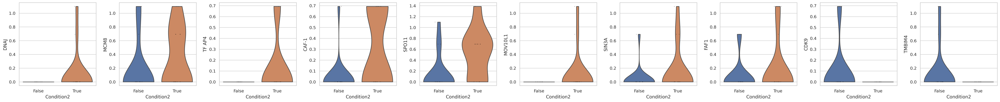

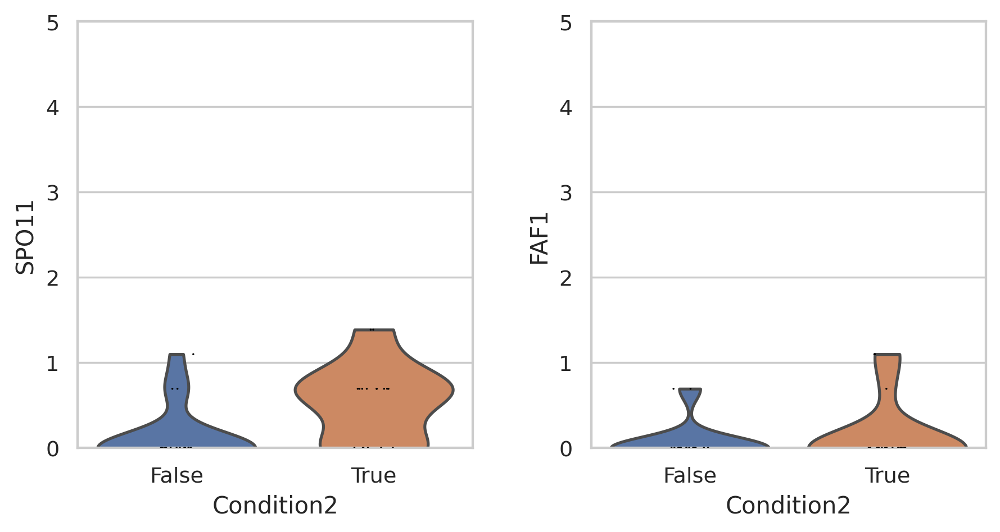

In [ ]:
newOfInterest = ['XLOC_012655','XLOC_004306','XLOC_037567','XLOC_006902','XLOC_016286','XLOC_037771',
                 'XLOC_035249','XLOC_012527','XLOC_001916','XLOC_015039']

clus35.obs['Condition2'] = pd.Categorical(clus35.obs['fed'])
#sc.pl.umap(clus35, color='Condition')
sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['DNAJ','MCM8','TF AP4','CAF-1','SPO11','MOV10L1',
                                                                 'SIN3A','FAF1','CDK9','TMBIM4'])



newOfInterest = ['XLOC_016286','XLOC_012527']
#sc.pl.umap(clus35, color='Condition')
axes = sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['SPO11','FAF1'],show=False)

for ax in axes:
  ax.set_ylim(0, 5)


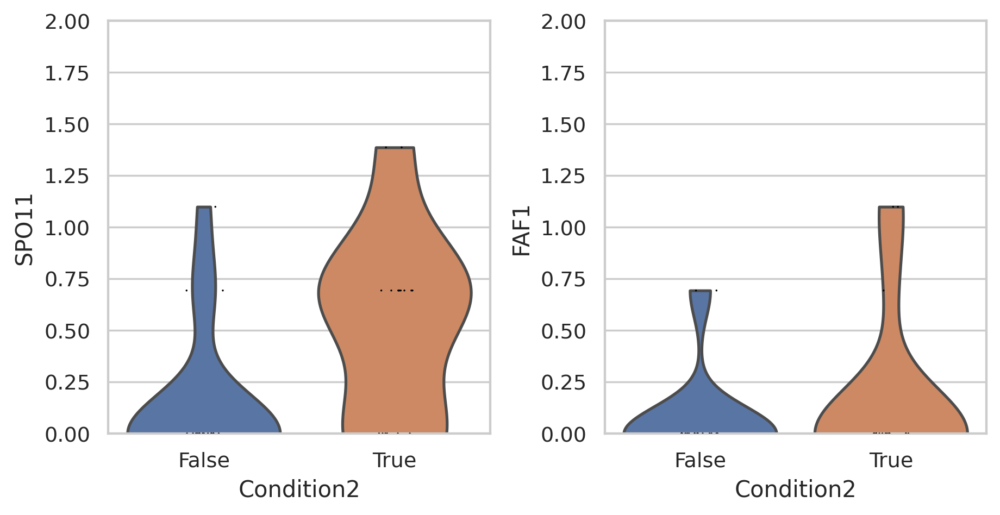

In [ ]:
axes = sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['SPO11','FAF1'],show=False)

for ax in axes:
  ax.set_ylim(0, 2)

###**Overlap with Original CellRanger Clusters** 

In [78]:
n=100
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(cellRanger_fs,groupby='louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [79]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

cellR = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  cellR[c] =  list(cellRanger_fs.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])


In [ ]:
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

In [80]:
from itertools import combinations_with_replacement

#Changed to calculate Jaccard Index
def intersect(i,j):
  return len(set(cellR[i]).intersection(busFS[j]))/len(set(cellR[i]).union(busFS[j]))

def pairwise(clus):        
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)          
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [81]:
pairCorrs = pairwise(clus)

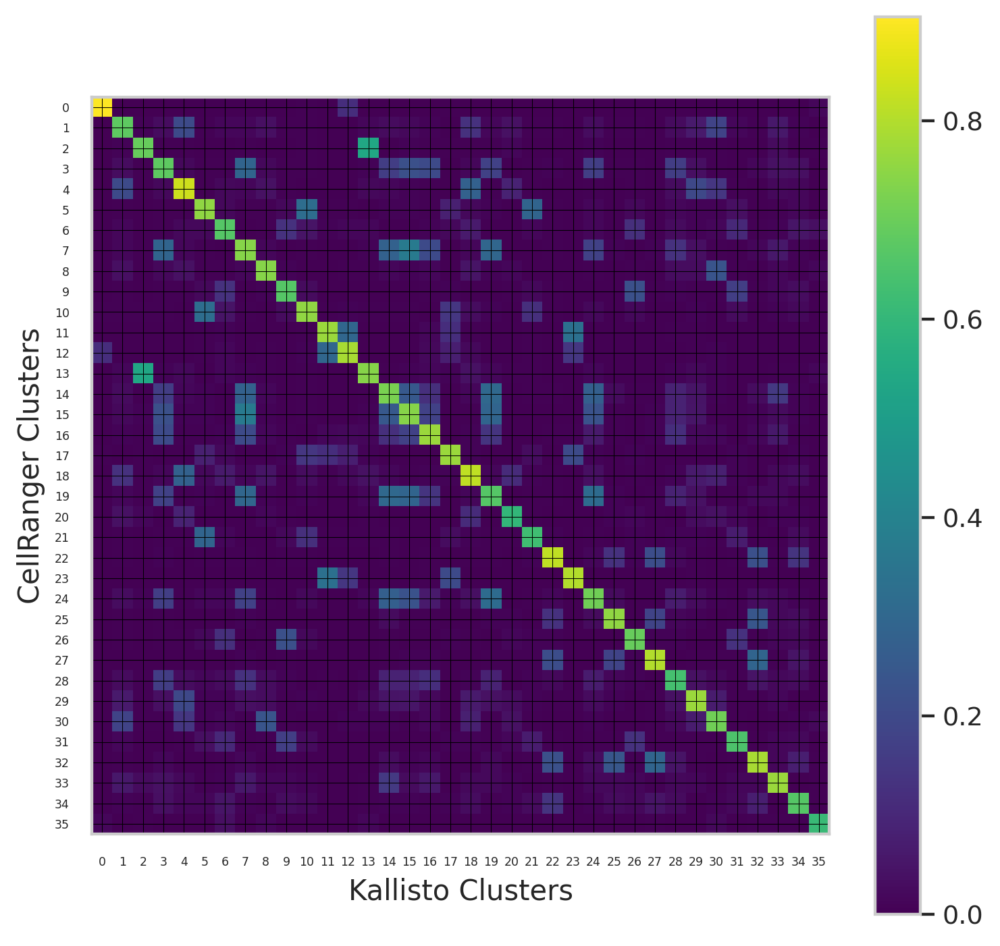

In [98]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()
plt.xlabel('Kallisto Clusters')
plt.ylabel('CellRanger Clusters')

plt.xticks(np.arange(0, 36, 1),fontsize=5)
plt.yticks(np.arange(0, 36, 1),fontsize=5)
plt.grid(color='black',linewidth=0.3)
plt.show()

In [ ]:
# from scipy.stats import pearsonr
# highly_var = list(set(bus_fs_clus.var_names).intersection(cellRanger_fs.var_names))
# sub = bus_fs_clus[:,highly_var]
# sub_cellR = cellRanger_fs[:,highly_var]

# corrs = []
# clus = []
# for c in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
#   cells = list(sub.obs['cellRanger_louvain'].isin([c]))
#   for i in range(0,3):#len(highly_var)
#     corrs += [pearsonr(sub.X[cells,i],sub_cellR.X[cells,i])[0]]
#     clus += [c]

# print(len(corrs))

# print(len(clus))

# #plt.scatter(sub.X,sub_cellR.X)

108
108


In [ ]:
# counts = pd.DataFrame()
# counts['cluster'] = clus
# counts['corr'] = corrs
# plt.figure(figsize=(16, 6))
# ax = sns.swarmplot(x="cluster", y="corr", data=counts,linewidth=0.5)
# ax.set(ylabel='Pearson Correlation of Variable Genes')
# ax.set(xlabel='Atlas Clusters')
# plt.show()
# plt.savefig('test.png')

In [ ]:
#len(range(0,len(highly_var)))
#plt.hist(corrs[0])
# just_corrs = []
# for i in range(0,len(corrs)):
#   just_corrs += [corrs[i][0]]

# #plt.hist(just_corrs,bins=20)
# plt.scatter(range(0,len(just_corrs)),just_corrs)

In [ ]:
#Composition of broad cell types between fed and starved , cell counts
counts = pd.DataFrame(columns =['count', 'orgID','condition','cluster']) 
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

c = []
org = []
cond = []
clus = []

orgs = np.unique(bus_fs_clus.obs['orgID'])
conds = ['True', 'False']
for cl in clusters:
    data = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([cl])]
    
    for cd in conds:
        #c_data = data[data.obs['condition'].isin([cd])]
        
        for o in orgs:
            pos = (data.obs['fed'].isin([cd])) & (data.obs['orgID'].isin([o]))
            org_data = data[pos]
            c += [org_data.n_obs]
            org += [o]
            if cd == 'True':
              cond += ['fed']
            else:
              cond += ['starved']
            clus += [cl]
            
                
print(len(c))


   
    
counts['count'] = c
counts['orgID'] = org
counts['condition'] = cond
counts['cluster'] = clus

720


In [ ]:
counts = counts[counts['count']> 0 ]
counts.head()

,count,orgID,condition,cluster
0,118,1,fed,0
2,83,2,fed,0
3,102,3,fed,0
4,102,4,fed,0
5,118,5,fed,0


In [ ]:
# ratio = np.sum(counts['count'][counts['condition'] == 'starved'])/np.sum(counts['count'][counts['condition'] == 'fed'])
# counts['count'][counts['condition'] == 'fed'] = counts['count'][counts['condition'] == 'fed']*ratio

In [ ]:
#One-way anova for each cluster
pvalsFTest = {}

for cl in clusters:
  sub = counts[counts.cluster == cl]
  subFed = sub[sub.condition == 'fed']
  subStarv = sub[sub.condition == 'starved']

  fedVals = list(subFed['count'])
  starvVals = list(subStarv['count'])

  pvalsFTest[cl] = scipy.stats.f_oneway(fedVals,starvVals)

  

In [ ]:
pvalsFTest

{0: F_onewayResult(statistic=8.73943838013499, pvalue=0.01825038234564978),
 1: F_onewayResult(statistic=0.14385629231955263, pvalue=0.7143463734609238),
 2: F_onewayResult(statistic=1.4649165005841522, pvalue=0.2606933600718263),
 3: F_onewayResult(statistic=0.32707551105548605, pvalue=0.5830944728389266),
 4: F_onewayResult(statistic=0.0014945200929923613, pvalue=0.9701095627111141),
 5: F_onewayResult(statistic=3.9211601065403956, pvalue=0.08302405054441193),
 6: F_onewayResult(statistic=0.36331614039501825, pvalue=0.5633624357600742),
 7: F_onewayResult(statistic=1.1448959365708624, pvalue=0.3158379042460989),
 8: F_onewayResult(statistic=0.6540513336688475, pvalue=0.4420529182129505),
 9: F_onewayResult(statistic=1.3303992455202764, pvalue=0.28202857763651257),
 10: F_onewayResult(statistic=90.14960629921269, pvalue=1.2483563501725025e-05),
 11: F_onewayResult(statistic=7.2029501525941, pvalue=0.02776069584522978),
 12: F_onewayResult(statistic=0.05353319057815846, pvalue=0.822833

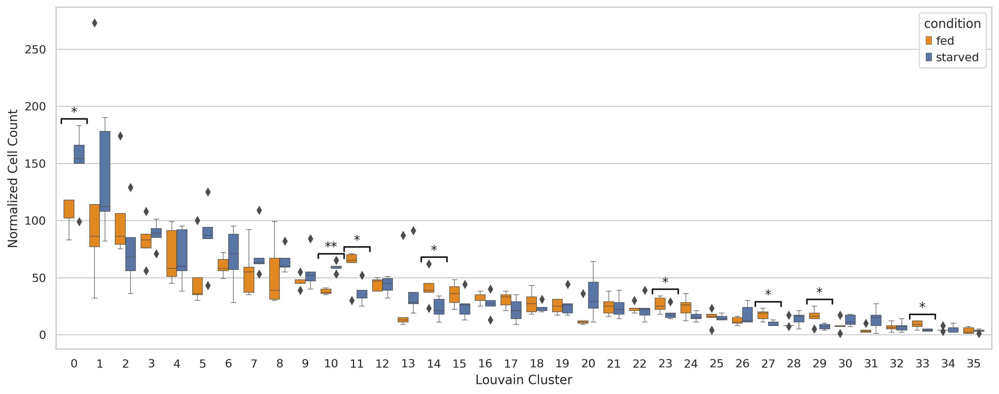

In [ ]:
#counts = counts[counts['count']> 0 ]
#https://stackoverflow.com/questions/36578458/how-does-one-insert-statistical-annotations-stars-or-p-values-into-matplotlib/37518947#37518947

counts['cluster'] = [int(i) for i in counts['cluster']] 
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="cluster", y="count", hue="condition", data=counts,linewidth=0.5,palette=["darkorange", "b"])
ax.set(ylabel='Normalized Cell Count')
ax.set(xlabel='Louvain Cluster')

# statistical annotation
# alpha < 0.05
for i in [0,11,14,23,27,29,33]:
  w = 0.5
  x1, x2 = i-w,i+w   # columns (see plt.xticks())

  y, h, col = counts['count'][counts['cluster'] == i].max() + 2, 4, 'k'
  plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
  plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)


#alpha <0.01
x1, x2 = 10-w,10+w   # columns (see plt.xticks())

y, h, col = counts['count'][counts['cluster'] == 10].max() + 2, 4, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "**", ha='center', va='bottom', color=col)

plt.show()



####**DE Genes in clusters of interest**

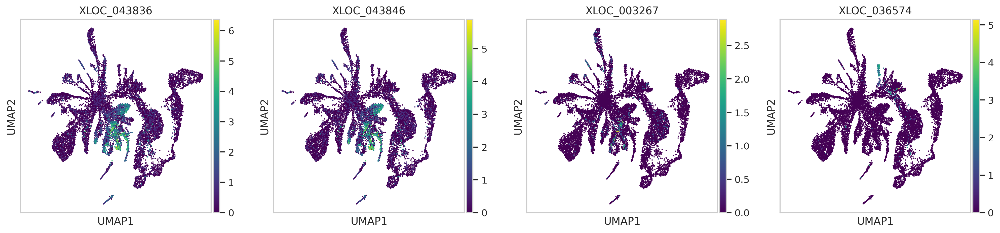

Trying to set attribute `.uns` of view, copying.


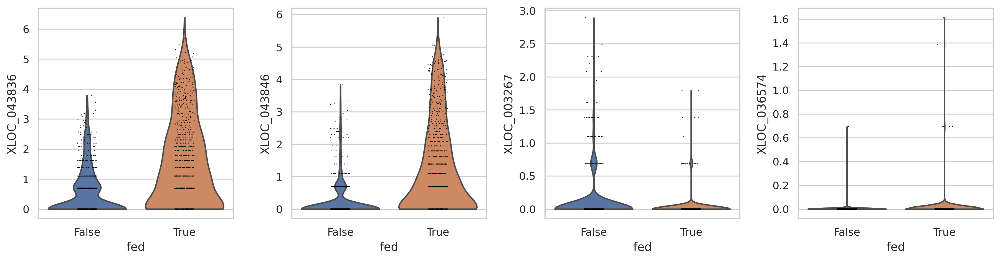

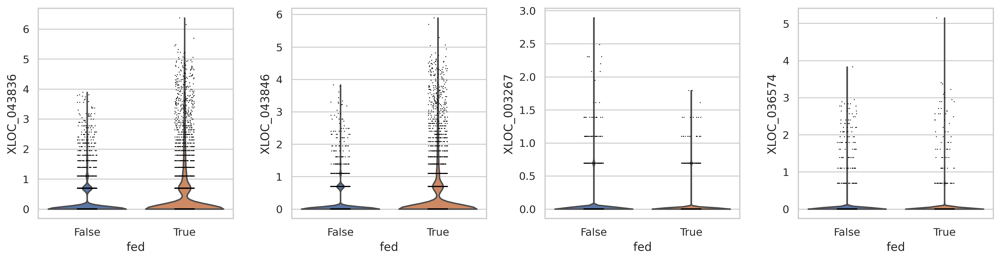

In [ ]:
#Examples of genes for clusters of interest
#metabolic gene (2x), dna pol delta, pp9 
select_clusters = bus_fs_clus[bus_fs_clus.obs['leiden'].isin(['15','7','12'])]
sc.pl.umap(bus_fs_clus,color=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],color_map='viridis')
sc.pl.violin(select_clusters,keys=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],groupby='fed')
sc.pl.violin(bus_fs_clus,keys=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],groupby='fed')

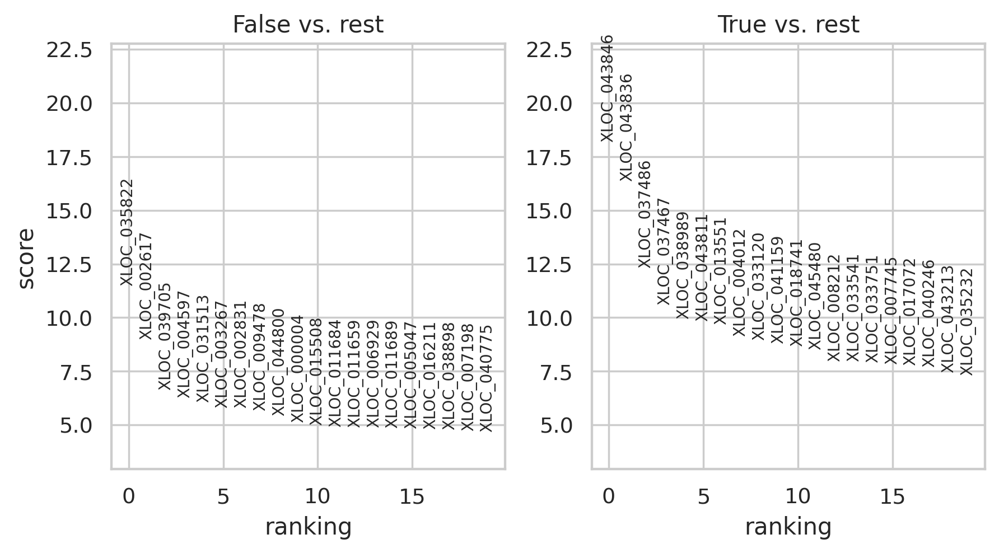

In [ ]:
#Using Rank_genes_groups between conditions (instead of between clusters as with marker genes)
#Obtain top DE Genes in cluster

#Get top DE genes between starved and fed
sc.tl.rank_genes_groups(select_clusters, 'fed',method='t-test')

sc.pl.rank_genes_groups(select_clusters)


### **Data for SplitsTree**

In [ ]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [83]:
#Compare to pairwise distances between cell atlas clusters
centroids = getClusCentroids(bus_fs_clus,60,'cellRanger_louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(36, 36)

In [92]:
# toAnnot = ['Stem Cells','Exumbrella Epidermis','Large Oocytes','Digestive Subtype 1',
#            'Manubrium Epidermis','Sensory Hair Cell Subtype 1','Neuroblasts','Digestive Subtype 2',
#            'Striated Muscle - Subumbrella','GLWamide Neurons','Sensory Hair Cell Subtype 2','Late Nematocytes',
#            'Nematocyte Precursor','Small Oocytes','Digestive Subtype 3','Digestive Subtype 4','Tentacle Bulb Epidermis',
#            'Nematocytes','Radial Smooth Muscles','Digestive Subtype 5','Tentacle Epidermis','Sensory Hair Cells Subtype 3',
#            'AP2 Gland Cells','Early Nematocytes','Digestive Subtype 6','Gland Cell Subtype','RFamide Neurons',
#            'Anistasin Gland Cells','Bioluminescent Cells','Gonad Epidermis','Striated Muscle - Velum',
#            'YFamide Neurons','Lipase Gland Cells','Endodermal Plate','Acidic Chitinase Gland Cells','Early Oocytes']

In [95]:

clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
df = pd.DataFrame(pairCentroid_dists)
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in bus_fs_clus.obs['cellRanger_louvain']]
annos = bus_fs_clus.obs['annosSub']

annosDict = {}
for i in range(0,len(clusters)):
  annosDict[clusters[i]] = annos[i]


names = [annosDict[i] for i in df['cluster']]

df['annos'] = names
df.head()

df.to_csv('cellTypeDist_SplitsTree.csv')

In [96]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,cluster,annos
0,0.000000,72.808786,66.327611,72.073472,72.221171,83.721519,72.069704,76.170223,70.880777,85.442991,97.183516,104.484268,49.543106,123.561482,101.361428,100.624817,90.397736,125.285881,106.140454,128.837399,85.624838,133.355707,122.865706,135.071855,130.381493,129.726836,119.031650,180.335733,99.932001,130.105311,112.277999,166.569771,232.595362,124.288189,231.023541,200.961265,0,Stem Cells
1,72.808786,0.000000,74.660422,70.164388,74.361114,89.556233,74.375085,71.364475,76.230698,84.757237,101.573907,113.137091,74.508928,121.889066,96.608405,97.168034,101.620417,134.557738,98.209424,110.046550,93.244312,132.928854,113.151650,131.356370,114.326233,130.695044,119.024909,160.223010,115.072821,143.600945,113.134615,168.345926,211.898876,129.203130,247.881609,247.091791,1,Exumbrella Epidermis
2,66.327611,74.660422,0.000000,65.337471,67.998920,82.508347,76.212882,75.176727,77.050640,84.104681,96.509748,102.126491,69.484831,99.308934,109.110518,92.275635,96.869360,123.762245,106.683458,133.013201,58.014817,137.969722,107.262283,133.557044,124.372263,122.873834,108.327791,181.305637,100.719740,135.554038,110.611939,161.064151,223.012427,102.849803,239.053946,226.983553,2,Large Oocytes
3,72.073472,70.164388,65.337471,0.000000,69.036448,89.045046,82.572017,56.716581,86.499065,91.058211,102.309510,106.470486,72.723282,121.345263,95.870870,81.374499,89.866108,122.379886,105.541089,116.827148,77.232297,139.550421,114.826228,123.779769,105.991631,131.019388,120.134342,176.077028,95.817422,127.819093,112.744109,175.211065,211.234152,116.989947,236.478488,235.921822,3,Digestive Subtype 1
4,72.221171,74.361114,67.998920,69.036448,0.000000,89.771920,78.915772,77.854646,83.597343,92.363973,104.900110,112.615641,76.581277,126.304038,114.492861,97.398086,98.526265,135.874766,102.497095,132.858654,73.100802,143.772648,117.754158,140.242021,124.825309,133.847399,118.384349,176.583669,107.611572,113.966628,93.500675,164.306995,228.605029,120.127074,240.596045,229.703254,4,Manubrium Epidermis
